In [1]:
import tiffslide as openslide
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imsave
import cv2
import imageio
from tifffile import imread

In [2]:
def normalize_CODEX(image):
  """Normalizes an image to uint8.

  Args:
    image: The image to be normalized.

  Returns:
    A normalized image in uint8 format.
  """

  max_value = np.iinfo(image.dtype).max
  image = image / max_value
  image = image * 255
  image = image.astype(np.uint8)

  return image

read_CODEX = imread("/blue/pinaki.sarder/j.maragall/CellMapping/15-1.tif")
CODEX = normalize_CODEX(read_CODEX)

In [74]:
def normalize_mask(image, target_dtype=np.uint8):
    normalized_image = cv2.normalize(image, None, 0, np.iinfo(target_dtype).max, cv2.NORM_MINMAX)
    return normalized_image.astype(target_dtype)



read_DAPI = openslide.open_slide("/home/j.maragall/Pipeline_CellMapping/glom_processed_image.tif")
DAPI_mask = normalize_mask(np.array(read_DAPI.get_thumbnail(read_DAPI.dimensions)), np.uint8)

# Desired dimensions
desired_width =  4908
desired_height = 17448

# Resizing the image to the desired dimensions
DAPI_mask = cv2.resize(DAPI_mask, (desired_width, desired_height), interpolation=cv2.INTER_LINEAR)


DAPI_mask = np.rot90(DAPI_mask)

DAPI_mask = np.flipud(DAPI_mask)

In [75]:
DAPI_mask.shape

(4908, 17448)

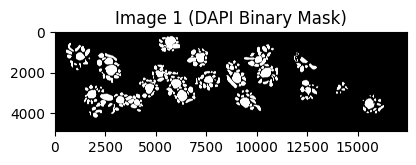

In [76]:
# Visualize the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(DAPI_mask, cmap='gray')
plt.title("Image 1 (DAPI Binary Mask)")

plt.show()

In [8]:
# Function to determine the position of channels within the image array
def position_channels(image):
    min_value = min(image.shape)
    if min_value == image.shape[0]:
        position = 0
    elif min_value == image.shape[1]:
        position = 1
    else:
        position = 2
    return position


In [9]:
CODEX.shape[position_channels(CODEX)]

44

In [13]:
# Function to extract a single channel from the image
def single_channel(image, channel_index):
    location = position_channels(image)
    if location == 0:
        return image[channel_index]
    elif location == 1:
        return image[:, channel_index]
    else:
        return image[:, :, channel_index]

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

def normalize_CODEX(image):
    max_value = np.iinfo(image.dtype).max
    image = image / max_value
    image = image * 255
    image = image.astype(np.uint8)
    return image

# Function to determine the position of channels within the image array
def position_channels(image):
    min_value = min(image.shape)
    if min_value == image.shape[0]:
        position = 0
    elif min_value == image.shape[1]:
        position = 1
    else:
        position = 2
    return position

# Function to extract a single channel from the image
def single_channel(image, channel_index):
    location = position_channels(image)
    if location == 0:
        return image[channel_index]
    elif location == 1:
        return image[:, channel_index]
    else:
        return image[:, :, channel_index]

# Load and normalize the CODEX image
read_CODEX = imread("/blue/pinaki.sarder/j.maragall/CellMapping/15-1.tif")
CODEX = normalize_CODEX(read_CODEX)

# Extract channel 25 from the normalized CODEX image
channel_25 = single_channel(CODEX, 6)  # Using index 24 for the 25th channel

# Define a threshold to create a binary mask from channel 25
# You may need to adjust this threshold based on the image data
threshold_value = 128

# Create the binary mask by thresholding channel 25
binary_mask_channel_25 = np.where(channel_25 > threshold_value, 1, 0).astype(np.uint8)

# Visualize the binary mask
plt.imshow(binary_mask_channel_25, cmap='gray')
plt.title('Binary Mask of Channel 25')
plt.axis('off')  # Hide the axis for a clearer view
plt.show()


KeyboardInterrupt: 

In [12]:
import tifffile as tf

# Specify the path and file name for the output TIFF file
output_mask_path = "channel_25_binary_mask.tif"

# Save the binary mask as a TIFF file
tf.imsave(output_mask_path, binary_mask_channel_25)


/scratch/local/27898796/ipykernel_2418070/2385813221.py:7: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tf.imsave(output_mask_path, binary_mask_channel_25)


In [13]:
pwd

'/home/j.maragall/Pipeline_CellMapping'

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tiffslide as openslide
from tifffile import imread
from skimage.measure import regionprops, label
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from joblib import Parallel, delayed
import pandas as pd
from umap import UMAP

/apps/jupyter/6.5.4/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-04-15 11:55:11.920127: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-15 11:55:17.866531: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [11]:
# Now let's extract features from each object in the binary mask
# First, label each object
labeled_image = label(DAPI_mask)
number_of_objects = labeled_image.max()

In [53]:
import numpy as np
from scipy.ndimage import label, sum

def label_with_min_area_threshold(binary_mask, min_area):
    # Step 1: Label the binary image
    labeled_image, num_features = label(binary_mask)
    
    # Step 2: Measure the size of each object
    areas = sum(binary_mask, labeled_image, index=np.arange(1, num_features + 1))
    
    # Step 3: Filter out objects smaller than the minimum area
    filtered_mask = np.zeros_like(labeled_image)
    for i, area in enumerate(areas):
        if area >= min_area:
            filtered_mask[labeled_image == i + 1] = i + 1  # Assign new labels to preserve numbering
    
    # Recalculate number of objects as some may have been removed
    number_of_objects = len(np.unique(filtered_mask)) - 1  # Subtract 1 for the background

    return filtered_mask, number_of_objects

# Example usage
min_area = 140000  # Define your minimum area threshold
labeled_image, number_of_objects = label_with_min_area_threshold(DAPI_mask, min_area)


In [54]:
number_of_objects

252

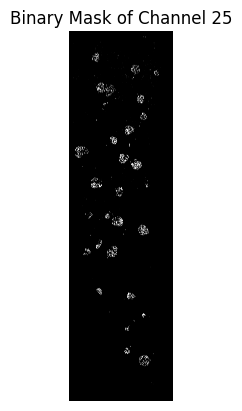

/scratch/local/27697728/ipykernel_2126396/2827444532.py:58: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tf.imsave(output_mask_path, binary_mask_channel_25)


In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
import tifffile as tf
from skimage.filters import threshold_otsu

def normalize_CODEX(image):
    # Normalize image to have values between 0 and 255
    image_normalized = (image - np.min(image)) / (np.max(image) - np.min(image)) * 255
    return image_normalized.astype(np.uint8)

def position_channels(image):
    # Determine the position of channels based on the shape of the image
    if image.shape[0] < image.shape[1] and image.shape[0] < image.shape[2]:
        position = 0
    elif image.shape[1] < image.shape[0] and image.shape[1] < image.shape[2]:
        position = 1
    else:
        position = 2
    return position

def single_channel(image, channel_index):
    # Extract a single channel from the image based on its position
    location = position_channels(image)
    if location == 0:
        return image[channel_index, :, :]
    elif location == 1:
        return image[:, channel_index, :]
    else:
        return image[:, :, channel_index]

# Load the CODEX image
read_CODEX = imread("/blue/pinaki.sarder/j.maragall/CellMapping/15-1.tif")

# Normalize the CODEX image
CODEX_normalized = normalize_CODEX(read_CODEX)

# Extract channel 25 from the normalized CODEX image using correct index (24)
channel_25 = single_channel(CODEX_normalized, 6)  # Zero-based indexing

# Define a threshold to create a binary mask from channel 25
# Using Otsu's method for automatic thresholding
threshold_value = threshold_otsu(channel_25)

# Create the binary mask by thresholding channel 25
binary_mask_channel_25 = np.where(channel_25 > threshold_value, 1, 0).astype(np.uint8)

# Visualize the binary mask
plt.imshow(binary_mask_channel_25, cmap='gray')
plt.title('Binary Mask of Channel 25')
plt.axis('off')  # Hide the axis for better visibility
plt.show()

# Specify the path and file name for the output TIFF file
output_mask_path = "channel_25_binary_mask.tif"

# Save the binary mask as a TIFF file
tf.imsave(output_mask_path, binary_mask_channel_25)

# Scale the binary mask to the full 8-bit range before saving
binary_mask_channel_25_scaled = binary_mask_channel_25 * 255

# Save the scaled binary mask as a TIFF file
tf.imsave(output_mask_path, binary_mask_channel_25_scaled)


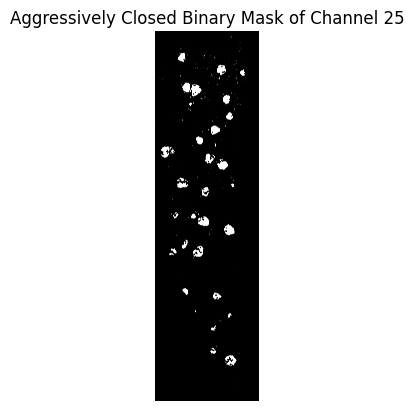

/scratch/local/27697728/ipykernel_2126396/4205828001.py:28: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tf.imsave("aggressively_closed_channel_25_binary_mask.tif", binary_mask_closed_scaled)


In [20]:
from skimage import morphology
import numpy as np

# Convert binary_mask_channel_25 to boolean for processing
binary_mask_boolean = binary_mask_channel_25.astype(bool)

# Use morphological closing to fill holes more aggressively
# Create a large disk-shaped structuring element for aggressive closing
structuring_element_size = 25  # Adjust size based on your needs
structuring_element = morphology.disk(structuring_element_size)

# Perform the closing operation with the correct argument name
binary_mask_closed = morphology.binary_closing(binary_mask_boolean, footprint=structuring_element)


# Remove small objects as before
min_size = 600  # Adjust this value as needed
binary_mask_cleaned = morphology.remove_small_objects(binary_mask_closed, min_size=min_size)

# Visualize the result
plt.imshow(binary_mask_closed, cmap='gray')
plt.title('Aggressively Closed Binary Mask of Channel 25')
plt.axis('off')
plt.show()

# Convert back to uint8 and scale to the full 8-bit range before saving
binary_mask_closed_scaled = (binary_mask_closed.astype(np.uint8) * 255)
tf.imsave("aggressively_closed_channel_25_binary_mask.tif", binary_mask_closed_scaled)


In [5]:
import pandas as pd

features_df = pd.read_csv("/home/j.maragall/PRESENTATION_FEATURES.csv")

In [6]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler


# Impute all NaN values with 0
features_df.fillna(0, inplace=True)


In [7]:
import numpy as np
import cv2

def normalize_mask(image, target_dtype=np.uint8):
    normalized_image = cv2.normalize(image, None, 0, np.iinfo(target_dtype).max, cv2.NORM_MINMAX)
    return normalized_image.astype(target_dtype)



read_DAPI = openslide.open_slide("/home/j.maragall/Pipeline_CellMapping/output_filled_shapes.tif")
DAPI_mask = normalize_mask(np.array(read_DAPI.get_thumbnail(read_DAPI.dimensions)), np.uint8)


# Assuming DAPI_mask is your input image with dimensions (height, width, channels)
# And assuming you have already obtained DAPI_mask as per your previous code

# Desired dimensions
desired_width =  4908
desired_height = 17448

# Resizing the image to the desired dimensions
DAPI_mask = cv2.resize(DAPI_mask, (desired_width, desired_height), interpolation=cv2.INTER_LINEAR)

# Step 4: Rotate the image by 90 degrees
DAPI_mask = np.rot90(DAPI_mask)

# Step 5: Reflect the image about the x-axis
DAPI_mask = np.flipud(DAPI_mask)

# DAPI_mask_resized is now the image with dimensions (4908, 17448, 3)



(-0.5, 17447.5, 4907.5, -0.5)

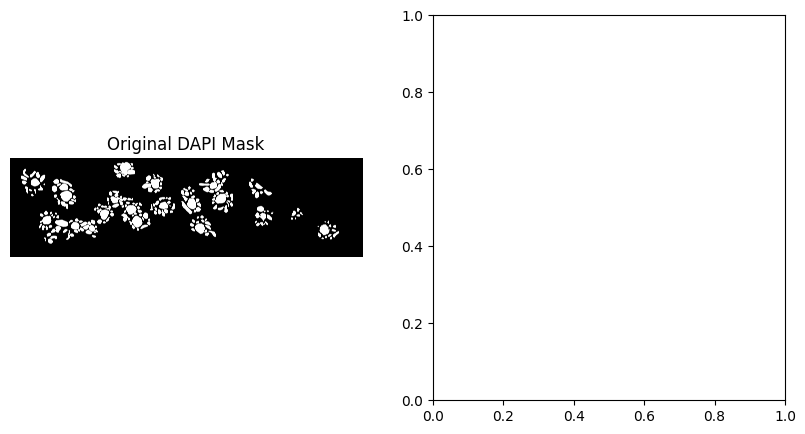

In [8]:
import matplotlib.pyplot as plt

# Assuming all previous steps are done and DAPI_mask_reflected is your final processed image

# Visualize the original DAPI_mask and the processed (rotated and reflected) DAPI_mask_reflected
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Original DAPI mask
ax[0].imshow(DAPI_mask, cmap='gray')
ax[0].set_title('Original DAPI Mask')
ax[0].axis('off')  # Hide axes ticks



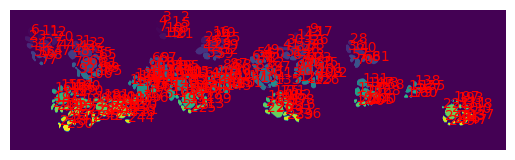

In [9]:
import cv2
import pandas as pd
import numpy as np
import tiffslide as openslide
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imsave
import imageio
from tifffile import imread
from skimage import measure

#def normalize_mask(image, target_dtype=np.uint8):
#    normalized_image = cv2.normalize(image, None, 0, np.iinfo(target_dtype).max, cv2.NORM_MINMAX)
#    return normalized_image.astype(target_dtype)

#read_DAPI = openslide.open_slide("/home/j.maragall/Pipeline_CellMapping/transformed_gloms_image.tif")
#DAPI_mask = normalize_mask(np.array(read_DAPI.get_thumbnail(read_DAPI.dimensions)), np.uint8)

# Label the shapes in the image
labeled_shapes, num_shapes = measure.label(DAPI_mask, return_num=True)

# Filter out shapes with an area smaller than 1000 pixels
shape_props = [prop for prop in measure.regionprops(labeled_shapes) if prop.area > 1000]

# Now, you can visualize the filtered shapes with enumeration:
fig, ax = plt.subplots()
ax.imshow(labeled_shapes, cmap='viridis')  # Use labeled_shapes for displaying distinct labels

# Enumerate and label only the shapes that meet the area criteria
for i, prop in enumerate(shape_props):
    ax.text(prop.centroid[1], prop.centroid[0], str(i+1), color='red')

plt.axis('off')
plt.show()

# The `shape_props` list now contains only the properties of shapes with area > 1000 pixels.


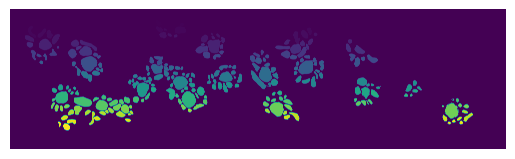

In [126]:
import cv2
import pandas as pd
import numpy as np
import tiffslide as openslide
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imsave
import imageio
from tifffile import imread
from skimage import measure

# List of specific shape labels to visualize
selected_labels = [104, 1, 13, 29, 40, 45, 45, 45, 76, 76, 85, 96, 125, 125, 144, 144, 174, 172, 172, 217, 210, 208, 210]

# Label the shapes in the image
labeled_shapes, num_shapes = measure.label(DAPI_mask, return_num=True)

# Filter out shapes with an area smaller than 1000 pixels and select only those in the specified labels list
shape_props = [prop for prop in measure.regionprops(labeled_shapes) if prop.area > 1000 and prop.label in selected_labels]

# Visualization setup
fig, ax = plt.subplots()
ax.imshow(labeled_shapes, cmap='viridis')  # Use labeled_shapes for displaying distinct labels

# Enumerate and label only the selected shapes
for prop in shape_props:
    ax.text(prop.centroid[1], prop.centroid[0], str(prop.label), color='red')  # Use the actual label for clarity

plt.axis('off')
plt.show()


In [80]:
len(shape_props)

250

In [106]:
import numpy as np
import cv2

def normalize_mask(image, target_dtype=np.uint8):
    normalized_image = cv2.normalize(image, None, 0, np.iinfo(target_dtype).max, cv2.NORM_MINMAX)
    return normalized_image.astype(target_dtype)



read_DOTS = openslide.open_slide("/home/j.maragall/Pipeline_CellMapping/dotted_processed_image.tif")
DOTS_mask = normalize_mask(np.array(read_DOTS.get_thumbnail(read_DOTS.dimensions)), np.uint8)


# Assuming DAPI_mask is your input image with dimensions (height, width, channels)
# And assuming you have already obtained DAPI_mask as per your previous code

# Desired dimensions
desired_width =  17448
desired_height = 4908

# Resizing the image to the desired dimensions
DOTS_mask = cv2.resize(DOTS_mask, (desired_width, desired_height), interpolation=cv2.INTER_LINEAR)

# Step 4: Rotate the image by 90 degrees
#DOTS_mask = np.rot90(DOTS_mask)

# Step 5: Reflect the image about the x-axis
DOTS_mask = np.flipud(DOTS_mask)

# DAPI_mask_resized is now the image with dimensions (4908, 17448, 3)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


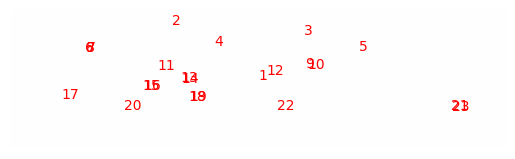

In [118]:
import cv2
import pandas as pd
import numpy as np
import tiffslide as openslide
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imsave
import imageio
from tifffile import imread
from skimage import measure

#def normalize_mask(image, target_dtype=np.uint8):
#    normalized_image = cv2.normalize(image, None, 0, np.iinfo(target_dtype).max, cv2.NORM_MINMAX)
#    return normalized_image.astype(target_dtype)

#read_DAPI = openslide.open_slide("/home/j.maragall/Pipeline_CellMapping/transformed_gloms_image.tif")
#DAPI_mask = normalize_mask(np.array(read_DAPI.get_thumbnail(read_DAPI.dimensions)), np.uint8)

# Label the shapes in the image
labeled_DOT_shapes, num_DOT_shapes = measure.label(DOTS_mask, return_num=True)

# Filter out shapes with an area smaller than 1000 pixels
DOT_shape_props = [prop for prop in measure.regionprops(labeled_DOT_shapes) if prop.area > 40]

# Now, you can visualize the filtered shapes with enumeration:
fig, ax = plt.subplots()
ax.imshow(labeled_DOT_shapes, cmap='viridis')  # Use labeled_shapes for displaying distinct labels

# Enumerate and label only the shapes that meet the area criteria
for i, prop in enumerate(DOT_shape_props):
    ax.text(prop.centroid[1], prop.centroid[0], str(i+1), color='red')

plt.axis('off')
plt.show()

# The `shape_props` list now contains only the properties of shapes with area > 1000 pixels.


In [121]:
len(DAPI_shape_props)

250

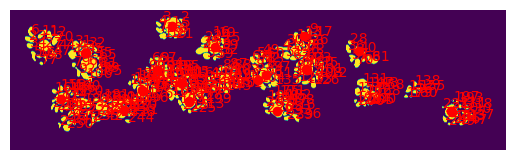

DOT centroids overlap with these DAPI shapes: [104, 1, 13, 29, 40, 45, 45, 45, 76, 76, 85, 96, 125, 125, 144, 144, 174, 172, 172, 217, 210, 208, 210]


In [122]:
import matplotlib.pyplot as plt
from skimage import measure
import numpy as np

# Label the DAPI shapes with a minimum area threshold
labeled_DAPI_shapes, num_DAPI_shapes = measure.label(DAPI_mask, return_num=True)
DAPI_shape_props = [prop for prop in measure.regionprops(labeled_DAPI_shapes) if prop.area > 1000]

# Create a mapping from the original labels to new sequential labels
label_map = {prop.label: idx + 1 for idx, prop in enumerate(DAPI_shape_props)}

# Label the DOT shapes with a different area threshold
labeled_DOT_shapes, num_DOT_shapes = measure.label(DOTS_mask, return_num=True)
DOT_shape_props = [prop for prop in measure.regionprops(labeled_DOT_shapes) if prop.area > 40]

# Extract centroids of DOT shapes
DOT_centroids = [prop.centroid for prop in DOT_shape_props]

# Check which DAPI shape each DOT shape's centroid belongs to
overlap_shape_numbers = []
for centroid in DOT_centroids:
    y, x = int(centroid[0]), int(centroid[1])
    dapi_shape_label = labeled_DAPI_shapes[y, x]
    if dapi_shape_label != 0:  # 0 would mean it's background or no shape
        # Use the mapped label for consistent output
        mapped_label = label_map.get(dapi_shape_label, None)
        if mapped_label:
            overlap_shape_numbers.append(mapped_label)

# Visualizing the results
fig, ax = plt.subplots()
ax.imshow(DAPI_mask, cmap='viridis')  # Visualize the DAPI mask
for label, prop in label_map.items():
    ax.text(DAPI_shape_props[prop - 1].centroid[1], DAPI_shape_props[prop - 1].centroid[0], str(prop), color='red')  # Label DAPI shapes

# Mark DOT centroids
for centroid in DOT_centroids:
    ax.plot(centroid[1], centroid[0], 'ro')  # Red dots on DAPI shapes

plt.axis('off')
plt.show()

# Print out which DAPI shapes the DOT centroids overlap
print("DOT centroids overlap with these DAPI shapes:", overlap_shape_numbers)


In [10]:
import cv2
import pandas as pd
import numpy as np
import tiffslide as openslide
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imsave
import imageio
from tifffile import imread
from skimage import measure
from shapely.geometry import box, Polygon

features_df = pd.read_csv("/home/j.maragall/j.maragall/Replication2 _DAPImapping/transformed_glom_features.csv")

# Impute all NaN values with 0
features_df.fillna(0, inplace=True)

# Initialize default to -1 for not labeled
features_df['shape_label'] = -1

# Iterate over each row in features_df
for index, row in features_df.iterrows():
    # Extract the bounding box coordinates of the object
    minr, maxr, minc, maxc = row['minr'], row['maxr'], row['minc'], row['maxc']
    
    # Create a shapely box object for the object's bounding box
    object_bbox = box(minc, minr, maxc, maxr)
    
    # Variable to check if the object has been labeled or is in the background
    is_labeled = False
    
    # Check if the object's bounding box is fully or partially contained within any of the shapes
    for shape_label, prop in enumerate(shape_props, 1):  # Start enumeration at 1
        # Use the bounding box of the shape to create a shapely box
        shape_bbox = box(*prop.bbox)
        
        # Check if the object's bounding box is fully contained within the shape's bounding box
        if shape_bbox.contains(object_bbox):
            features_df.at[index, 'shape_label'] = shape_label
            is_labeled = True
            break
        # Check for partial overlap if not fully contained
        elif shape_bbox.intersects(object_bbox):
            features_df.at[index, 'shape_label'] = 0  # Set as background
            is_labeled = True
            
    # If the object was not labeled and had no overlap, it remains -1 (Not Labeled)

# Verify the number of objects for each label type
print(features_df['shape_label'].value_counts())


shape_label
-1      15373
 0       1126
 172      181
 96       160
 66       159
        ...  
 180        1
 221        1
 124        1
 156        1
 182        1
Name: count, Length: 247, dtype: int64


In [13]:
import pandas as pd

# Assuming features_df is already defined and loaded
# Filter the DataFrame to remove rows where 'shape_label' is -1
features_df = features_df[features_df['shape_label'] != -1]

features_df.shape

(6907, 627)

In [14]:
import pandas as pd

# List of shape labels that should be marked as 'glomerulus'
glomerulus_labels = [104, 1, 13, 29, 40, 45, 45, 45, 76, 76, 85, 96, 125, 125, 144, 144, 174, 172, 172, 217, 210, 208, 210]

# Create a new column 'glomerulus', set to 1 where 'shape_label' is in the specified list, 0 otherwise
features_df['glomerulus'] = features_df['shape_label'].isin(glomerulus_labels).astype(int)

# Save changes if necessary
features_df.to_csv("/home/j.maragall/Pipeline_CellMapping/membership_good_filtered_glom_features.csv", index=False)


In [15]:
features_df = pd.read_csv("/home/j.maragall/Pipeline_CellMapping/membership_good_filtered_glom_features.csv")

In [16]:
features_df.shape

(6907, 628)

In [4]:
import cv2
import pandas as pd
import numpy as np
import tiffslide as openslide
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imsave
import imageio
from tifffile import imread
from skimage import measure
from shapely.geometry import box, Polygon

features_df = pd.read_csv("/home/j.maragall/j.maragall/Replication2 _DAPImapping/transformed_glom_features.csv")

# Impute all NaN values with 0
features_df.fillna(0, inplace=True)

In [3]:
import cv2
import pandas as pd
import numpy as np
import tiffslide as openslide
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imsave
import imageio
from tifffile import imread
from skimage import measure
from shapely.geometry import box, Polygon

features_df = pd.read_csv("/home/j.maragall/Pipeline_CellMapping/filtered_glom_features.csv")

# Impute all NaN values with 0
features_df.fillna(0, inplace=True)

In [2]:
features_df.shape

(22280, 627)

In [70]:
print(features_df['shape_label'].value_counts())

shape_label
0      1006
89      118
166     108
11      102
102      99
       ... 
108       1
5         1
232       1
177       1
160       1
Name: count, Length: 227, dtype: int64


In [12]:
# Filter out shapes with an area smaller than 1000 pixels
shape_props = [prop for prop in measure.regionprops(labeled_shapes) if prop.area > 1000]

# Print the number of shapes with area greater than 1000 pixels
shape_count = len(shape_props)
print("Number of shapes with area > 1000 pixels:", shape_count)


Number of shapes with area > 1000 pixels: 238


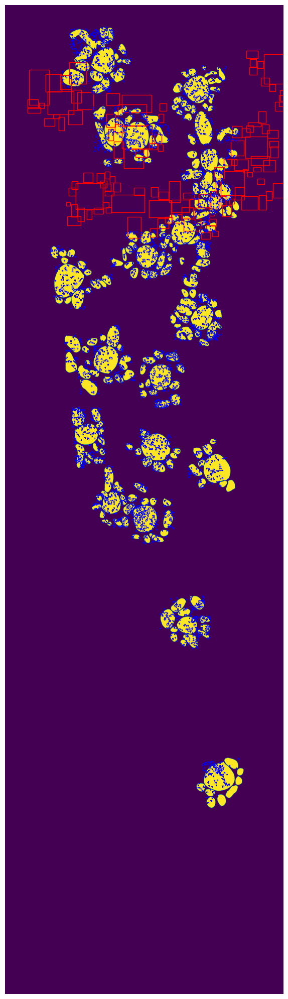

In [28]:
import matplotlib.patches as patches

# Load the original image (if available) or DAPI_mask if it matches the original dimensions
# original_img = imread('/path/to/original_image.tif')  # Use the original image path if available
original_img = DAPI_mask  # Use this if it matches the original dimensions

fig, ax = plt.subplots(figsize=(10, 20))  # Adjust size as needed
ax.imshow(original_img)

# Plot bounding boxes from shape_props
for prop in shape_props:
    minr, minc, maxr, maxc = prop.bbox
    rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr, edgecolor='red', facecolor='none')
    ax.add_patch(rect)

# Plot bounding boxes from features_df
for index, row in features_df.iterrows():
    minr, maxr, minc, maxc = row['minr'], row['maxr'], row['minc'], row['maxc']
    rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr, edgecolor='blue', facecolor='none', linestyle='--')
    ax.add_patch(rect)

ax.set_axis_off()
plt.tight_layout()
plt.show()


In [ ]:
# Save the plot as a PNG image
plt.savefig('bounding_boxes.png', dpi=300, bbox_inches='tight')

plt.show()

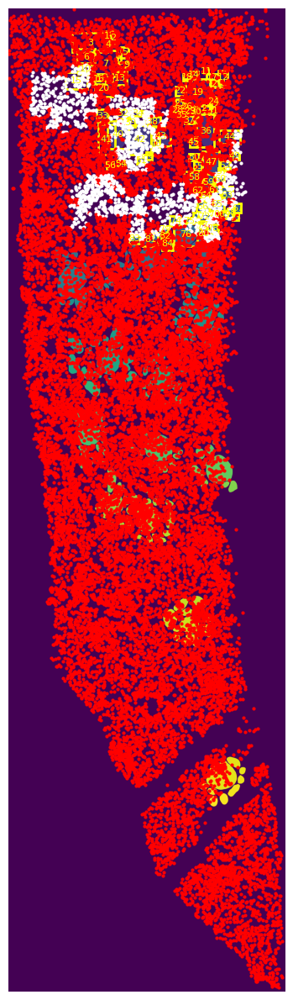

In [27]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from skimage import io

# I'm assuming that 'labeled_shapes' and 'features_df' are already loaded and properly defined,
# along with 'num_shapes' and 'shape_props'.

# Convert the labeled_shapes image to RGB for colorful visualization
labeled_shapes_rgb = plt.cm.viridis(labeled_shapes / num_shapes)[:, :, :3]  # Normalize and remove alpha channel

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(labeled_shapes_rgb)  # Display the labeled shapes in color

# Overlay bounding box centroids of objects on the shapes
for _, row in features_df.iterrows():
    # Calculate centroids from the bounding box coordinates
    centroid_x = (row['minc'] + row['maxc']) / 2
    centroid_y = (row['minr'] + row['maxr']) / 2
    label = row['shape_label']
    color = 'white' if label != -1 else 'red'  # White for labeled, red for unlabeled/background
    
    # Mark the centroid
    ax.plot(centroid_x, centroid_y, 'o', color=color, markersize=2)

# Highlight labeled shapes with a distinct border
for i, prop in enumerate(shape_props):
    if any(features_df['shape_label'] == i + 1):
        # Draw a border around the shape
        minr, minc, maxr, maxc = prop.bbox
        rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr, linewidth=2, edgecolor='yellow', facecolor='none')
        ax.add_patch(rect)
        # Add label text at the centroid position
        centroid_x = (minc + maxc) / 2
        centroid_y = (minr + maxr) / 2
        ax.text(centroid_x, centroid_y, str(i+1), color='yellow', fontsize=8, ha='center', va='center')

ax.axis('off')
plt.tight_layout()
plt.show()


In [16]:
from skimage.measure import find_contours
from shapely.geometry import Polygon, Point

# Create a list to store the polygons for each shape
shape_polygons = []

for i, prop in enumerate(shape_props):
    # Find contours at the "0.5" level in the binary image
    contours = find_contours(labeled_shapes == prop.label, 0.5)
    for contour in contours:
        # Convert the contour coordinates to a polygon
        # and store it with an incrementing label
        polygon = Polygon(contour)
        shape_polygons.append((i + 1, polygon))


In [21]:
len(shape_props)

238

In [17]:
# Create a new column for shape labels
features_df['shape_label'] = -1  # Initialize all to -1

# Iterate over each row in features_df to assign labels
for index, row in features_df.iterrows():
    object_point = Point(row['centroid_x'], row['centroid_y'])
    max_overlap = 0
    object_label = -1

    # Check if the object's centroid is within any of the shape polygons
    for label, polygon in shape_polygons:
        if polygon.contains(object_point):
            # If more than one shape contains the object, pick the one with the largest overlap
            overlap = object_point.buffer(0).intersection(polygon).area
            if overlap > max_overlap:
                max_overlap = overlap
                object_label = label

    # Assign the label with the maximum overlap, or leave as -1 if no overlap was found
    features_df.at[index, 'shape_label'] = object_label


In [18]:
print(features_df['shape_label'].value_counts())


shape_label
-1    22280
Name: count, dtype: int64


In [16]:
# Remove all rows where 'shape_label' is -1 (Not Labeled)
features_df = features_df[features_df['shape_label'] != -1]

# Now, features_df contains only the rows where the objects are labeled or are considered as background


In [63]:
# Optionally, save the filtered DataFrame to a new CSV file
features_df.to_csv("filtered_glom_features.csv", index=False)



KeyboardInterrupt



In [18]:
features_df.shape

(4577, 627)

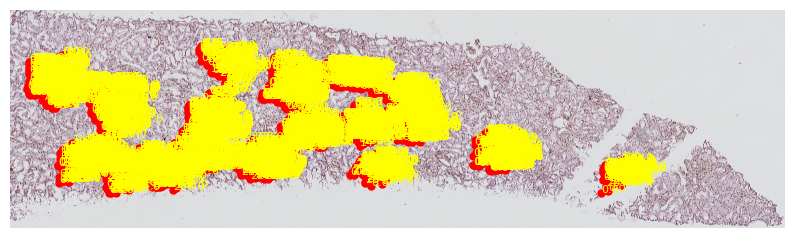

In [26]:
import matplotlib.pyplot as plt

from skimage import io

# Loading the image
transformed_img3 = io.imread("/home/j.maragall/j.maragall/Replication2 _DAPImapping/transformed_image.tif")

# Assuming normalize_mask simply casts to np.uint8
transformed_img3 = transformed_img3.astype(np.uint8)

# Step 4: Rotate the image by 90 degrees
transformed_img3_rotated = np.rot90(transformed_img3)

# Step 5: Reflect the image about the x-axis
transformed_img3_reflected = np.flipud(transformed_img3_rotated)


# Assuming transformed_img3 has been loaded with the image data

# Create a figure and axis for plotting the image
fig, ax = plt.subplots(figsize=(10, 10))  # You might want to adjust the figure size for better visibility

# Display the image
ax.imshow(transformed_img3_reflected)

# Iterate through each row in features_df to place markers and label numbers based on centroid coordinates
for index, row in features_df.iterrows():
    # Extract the centroid coordinates
    centroid_x = row['centroid_x']
    centroid_y = row['centroid_y']
    # Extract the shape label
    label = row['shape_label']
    
    # Plot a red circle marker at the centroid location
    ax.plot(centroid_x, centroid_y, 'ro', markersize=5)  # Adjust markersize as needed
    
    # Overlay the label number
    ax.text(centroid_x + 5, centroid_y, str(label), color='yellow', fontsize=8)  # Adjust text offset and size as needed

# Remove axis labels and ticks for a cleaner image
ax.axis('off')

# Show the plot
plt.show()


In [43]:
features_df.columns

Index(['channel_0_mean', 'channel_0_std', 'channel_0_variance',
       'channel_0_entropy', 'channel_1_mean', 'channel_1_std',
       'channel_1_variance', 'channel_1_entropy', 'channel_2_mean',
       'channel_2_std',
       ...
       'channel_43_min_intensity', 'channel_43_sum_intensity', 'centroid_x',
       'centroid_y', 'orientation', 'minr', 'minc', 'maxr', 'maxc',
       'shape_label'],
      dtype='object', length=627)

/scratch/local/28274753/ipykernel_1505811/377903581.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('hsv')  # 'hsv' gives a wide range of colors


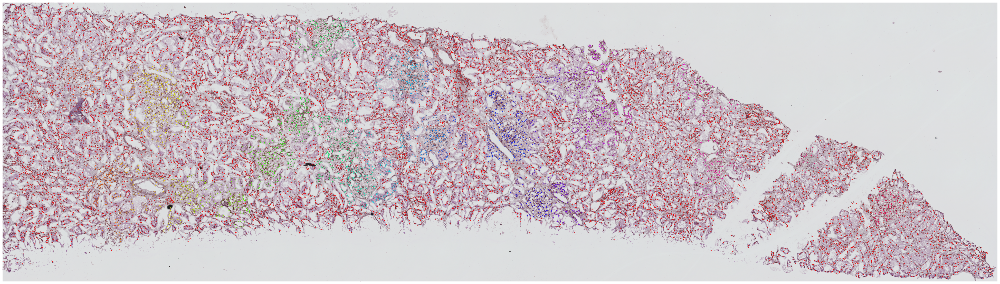

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from matplotlib.cm import get_cmap

# Assuming necessary imports and image transformation code as provided
unique_labels = features_df['shape_label'].unique()
# Assuming transformed_img3 has been loaded with the image data

# Create a figure and axis for plotting the image
fig, ax = plt.subplots(figsize=(50, 50))  # Adjust the figure size for better visibility

# Display the image
ax.imshow(transformed_img3_reflected)

# Assuming features_df is defined and contains the columns centroid_x, centroid_y, and shape_label

# Create a colormap
cmap = get_cmap('hsv')  # 'hsv' gives a wide range of colors

# Adjust the color mapping for unique labels, excluding label 0 for special treatment
label_to_color = {label: cmap(i / (len(unique_labels) - 1)) for i, label in enumerate(unique_labels) if label != 0}

# Special color for label 0
label_to_color[0] = 'white'

# Iterate through each row in features_df to place uniquely colored markers based on centroid coordinates
for index, row in features_df.iterrows():
    # Extract the centroid coordinates
    centroid_x = row['centroid_x']
    centroid_y = row['centroid_y']
    
    # Check if the shape label is 0 for special coloring
    color = label_to_color.get(row['shape_label'], 'red')  # Default to red if something goes wrong
    
    # Plot a circle marker at the centroid location with the designated color
    ax.plot(centroid_x, centroid_y, 'o', markersize=1, color=color, alpha=0.8)  # Adjust markersize and alpha as needed

# Remove axis labels and ticks for a cleaner image
ax.axis('off')

# Save the figure before showing it
plt.savefig('gloms_image_with_markers.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


In [29]:
features_df.columns

Index(['channel_0_mean', 'channel_0_std', 'channel_0_variance',
       'channel_0_entropy', 'channel_1_mean', 'channel_1_std',
       'channel_1_variance', 'channel_1_entropy', 'channel_2_mean',
       'channel_2_std',
       ...
       'channel_43_min_intensity', 'channel_43_sum_intensity', 'centroid_x',
       'centroid_y', 'orientation', 'minr', 'minc', 'maxr', 'maxc',
       'shape_label'],
      dtype='object', length=627)

In [6]:
import matplotlib.pyplot as plt
from skimage import io
from skimage.color import label2rgb


# Loading the image
transformed_img3 = io.imread("/home/j.maragall/j.maragall/Replication2 _DAPImapping/transformed_image.tif")

# Assuming normalize_mask simply casts to np.uint8
transformed_img3 = transformed_img3.astype(np.uint8)

# Step 4: Rotate the image by 90 degrees
transformed_img3_rotated = np.rot90(transformed_img3)

# Step 5: Reflect the image about the x-axis
transformed_img3_reflected = np.flipud(transformed_img3_rotated)

# Assuming 'transformed_img3_reflected' and 'labeled_shapes' are already defined

# Convert the labeled image to an RGB image, where each label gets a unique color
# The 'alpha' parameter controls the transparency of the overlay
labeled_overlay = label2rgb(labeled_shapes, image=transformed_img3_reflected, bg_label=0, alpha=0.4, kind='overlay')

# Create a figure for plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Display the color-coded labeled image
ax.imshow(labeled_overlay)

# Hide axis labels and ticks for a cleaner visualization
ax.axis('off')

# Save the figure to a PNG file with high resolution
plt.savefig("gloms_overlayed_image.png", bbox_inches='tight', pad_inches=0, dpi=300)  # Increase dpi for higher resolution

# Close the plotting figure to free resources
plt.close(fig)


In [ ]:
# Count the number of unique 'shape_label' values in the DataFrame
unique_labels_count = features_df['shape_label'].nunique()

print("Number of unique labels:", unique_labels_count)


In [87]:
transformed_img3.shape

(17448, 4908, 3)

In [88]:
DAPI_mask.shape

(17448, 4908)

In [20]:
# Aggregate the rows by 'shape_label' and sum all other numerical columns
aggregated_df = features_df.groupby('shape_label').sum().reset_index()

# Now, aggregated_df should contain 280 rows, one for each label
print(aggregated_df)


     shape_label  channel_0_mean  channel_0_std  channel_0_variance  \
0              0   170590.855243   32797.983535        1.258512e+06   
1              1     1107.711170     314.253325        1.369867e+04   
2              2    13915.748825    2901.829852        9.818600e+04   
3              3      577.448170     144.170681        5.445635e+03   
4              4      297.889600      88.611265        3.926306e+03   
..           ...             ...            ...                 ...   
222          228      363.048940      58.396652        1.820717e+03   
223          229      152.741840      50.569416        2.557266e+03   
224          232      195.080180       9.790648        9.585678e+01   
225          234      464.109890     102.488693        3.517293e+03   
226          235      201.221320      45.366636        1.084276e+03   

     channel_0_entropy  channel_1_mean  channel_1_std  channel_1_variance  \
0          3924.388781             0.0            0.0                 

In [ ]:
from skimage import io

# Loading the image
transformed_img3 = io.imread("/home/j.maragall/j.maragall/Replication2 _DAPImapping/transformed_image.tif")

In [23]:
import pandas as pd
from skimage.measure import regionprops

# Create an empty list to store the object extents data
object_extents_data = []

# Iterate over each labeled object
for region in regionprops(labeled_image):
    # Get the minimum and maximum row and column coordinates of the object
    minr, minc, maxr, maxc = region.bbox
    # Append the object extents data to the list
    object_extents_data.append([minr, minc, maxr, maxc])

# Create a DataFrame from the object extents data
df_object_extents = pd.DataFrame(object_extents_data, columns=['minr', 'minc', 'maxr', 'maxc'])

# Print the DataFrame
print(df_object_extents)

# Read the features_df DataFrame from the CSV file
features_df = pd.read_csv("/home/j.maragall/PRESENTATION_FEATURES.csv")
# Reset the index of features_df
features_df.reset_index(drop=True, inplace=True)

# Reset the index of df_object_extents
df_object_extents.reset_index(drop=True, inplace=True)

# Concatenate features_df and df_object_extents horizontally
merged_df = pd.concat([features_df, df_object_extents], axis=1)

# Print the merged DataFrame
print(merged_df)

        minr  minc   maxr  maxc
0        395  1718    396  1719
1        395  1719    396  1728
2        395  1728    396  1733
3        395  1733    396  1734
4        396  1709    397  1710
...      ...   ...    ...   ...
94723  14161  3649  14162  3650
94724  14161  3650  14162  3651
94725  14162  3633  14163  3634
94726  14162  3634  14163  3644
94727  14162  3644  14163  3645

[94728 rows x 4 columns]
       channel_0_mean  channel_0_std  channel_0_variance  channel_0_entropy  \
0           48.707546       4.549449           20.697490           2.824315   
1           52.120000       5.513523           30.398933           2.987636   
2           61.037735      14.205649          201.800460           3.831398   
3           55.427418       8.183553           66.970535           3.293343   
4           75.893130      18.701248          349.736660           4.118717   
...               ...            ...                 ...                ...   
94723             NaN            NaN 

In [21]:
features_df['shape_label'].sample(5)

418       6
4311    126
320       6
4503    205
2150     30
Name: shape_label, dtype: int64

In [44]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import img_as_ubyte
from matplotlib import cm

# Assuming the following variables are already defined:
# - DAPI_mask: The mask image
# - transformed_img3: The image on which to overlay the labeled objects
# - labeled_image: An image array where each object's pixels are labeled with an integer
# - features_df: A DataFrame that contains labels for each object in 'labeled_image'

# Use a continuous colormap capable of supporting a broad range of colors
cmap = cm.get_cmap('viridis', len(features_df['shape_label'].unique()))

# Prepare the colors for each label found in the DataFrame
labels_sorted = features_df['shape_label'].sort_values().unique()
normalized_labels = np.linspace(0, 1, len(labels_sorted))  # Evenly spaced values in [0, 1]
colored_labels = cmap(normalized_labels)[:, :3]  # Extract RGB colors
colored_labels = img_as_ubyte(colored_labels)  # Convert to 8-bit unsigned byte format

# Initialize a blank RGB image for coloring the objects
colored_image = np.zeros((*DAPI_mask.shape, 3), dtype=np.uint8)

# Map each label to its color and apply it to the corresponding pixels in 'labeled_image'
label_to_color_idx = {label: idx for idx, label in enumerate(labels_sorted)}
for label, color_idx in label_to_color_idx.items():
    object_mask = labeled_image == label
    colored_image[object_mask] = colored_labels[color_idx]

# Normalize 'transformed_img3' for blending, if necessary
transformed_img3_normalized = img_as_ubyte(transformed_img3 / transformed_img3.max())

# Combine the colored objects with the original image
combined_img = cv2.addWeighted(transformed_img3_normalized, 0.6, colored_image, 0.4, 0)

# Display the combined image
plt.figure(figsize=(10, 10))
plt.imshow(combined_img)
plt.title("Overlay of Clustered Objects on Transformed Image")
plt.axis('off')
plt.show()


/scratch/local/27652165/ipykernel_2998858/4270505928.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(features_df['shape_label'].unique()))


NameError: name 'labeled_image' is not defined

In [10]:
import numpy as np
import pandas as pd
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects

# Assuming your binary mask is stored in a variable called 'binary_mask'
labeled_mask = label(DAPI_mask)

# Remove small objects (adjust the size threshold as needed)
labeled_mask = remove_small_objects(labeled_mask, min_size=1000)

# Re-label the mask after removing small objects
labeled_mask = label(labeled_mask)

# Create an empty list to store the object information
object_info = []

# Iterate over each labeled object
for region in regionprops(labeled_mask):
    # Get the bounding box coordinates of the object
    minr, minc, maxr, maxc = region.bbox
    
    # Append the object information to the list
    object_info.append([minr, maxr, minc, maxc])

# Create a DataFrame from the object information
df = pd.DataFrame(object_info, columns=['minr', 'maxr', 'minc', 'maxc'])

# Group the DataFrame by the object label and aggregate the rows
aggregated_df = df.groupby(df.index).agg({'minr': 'min', 'maxr': 'max', 'minc': 'min', 'maxc': 'max'}).reset_index(drop=True)

print(aggregated_df)

      minr   maxr  minc  maxc
0      396    584  1669  1820
1      401    629  1810  1906
2      428    782  1140  1762
3      600    690  1731  1825
4      689    874  1999  2133
..     ...    ...   ...   ...
233  13732  13874  3375  3528
234  13766  13987  3889  4103
235  13836  13957  3530  3697
236  13928  14129  3743  3892
237  13973  14162  3556  3708

[238 rows x 4 columns]


In [25]:
merged_df.to_csv('glom_features.csv', index=False)

In [60]:
import pandas as pd

# Optimized function to extract features from a single object
def extract_features(region_label):
    object_mask = (labeled_image == region_label)
    
    # Get the properties of the object
    properties = regionprops(object_mask.astype(int))[0]
    area = properties.area
    perimeter = properties.perimeter
    eccentricity = properties.eccentricity
    
    channel_features = np.zeros(4 * CODEX.shape[position_channels(CODEX)] + 3, dtype=np.float32)
    
    # Extract the channel and calculate the features
    for channel_index in range(CODEX.shape[position_channels(CODEX)]):
        single_channel_img = single_channel(CODEX, channel_index)
        masked_single_channel = single_channel_img * object_mask
        channel_data = masked_single_channel[object_mask]
        mean_intensity = np.mean(channel_data)
        std_intensity = np.std(channel_data)
        variance_intensity = np.var(channel_data)
        hist, _ = np.histogram(channel_data, bins=256, range=(0, 256), density=True)
        entropy_intensity = entropy(hist)
        
        index = channel_index * 4
        channel_features[index] = mean_intensity
        channel_features[index + 1] = std_intensity
        channel_features[index + 2] = variance_intensity
        channel_features[index + 3] = entropy_intensity
    
    # Storing object features at the end
    channel_features[-3] = area
    channel_features[-2] = perimeter
    channel_features[-1] = eccentricity
    
    # Return the object features
    return channel_features

# Parallel feature extraction
num_channels = CODEX.shape[position_channels(CODEX)]
num_features_per_channel = 4  # mean, std, variance, entropy
num_object_features = 3  # area, perimeter, eccentricity

# Pre-allocate memory
features_array = np.zeros((number_of_objects, num_features_per_channel * num_channels + num_object_features), dtype=np.float32)

# Parallel extraction
features_list = Parallel(n_jobs=6)(delayed(extract_features)(region_label) for region_label in range(1, number_of_objects + 1))

# Copy the features from the list to the pre-allocated NumPy array
for i, features in enumerate(features_list):
    features_array[i, :] = features
    
    # Convert to dataframe
    columns = [f'channel_{i}_mean' for i in range(num_channels)] + [f'channel_{i}_std' for i in range(num_channels)] + \
              [f'channel_{i}_variance' for i in range(num_channels)] + [f'channel_{i}_entropy' for i in range(num_channels)] + \
              ['area', 'perimeter', 'eccentricity']
    features_df = pd.DataFrame(features_array[:i+1], columns=columns)
    
    # Save the dataframe to CSV
    features_df.to_csv('glom_features.csv', index=False)

# Applying UMAP
embedding = UMAP(n_neighbors=15, min_dist=0, n_components=2).fit_transform(features_df)

# Plotting the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors')
plt.show()

IndexError: list index out of range

In [61]:
from joblib import Parallel, delayed

def extract_features_safe(region_label):
    try:
        return extract_features(region_label)
    except IndexError as e:
        print(f"Error processing region_label {region_label}: {e}")
        # Optionally, re-raise the error if you want the process to still crash
        raise

# Use the safe wrapper in your parallel call
features_list = Parallel(n_jobs=16)(
    delayed(extract_features_safe)(region_label) for region_label in range(1, number_of_objects + 1)
)


IndexError: list index out of range

In [55]:
import numpy as np
import pandas as pd
from skimage.measure import regionprops
from joblib import Parallel, delayed
from umap import UMAP
import matplotlib.pyplot as plt

# Import or define any missing functions such as `position_channels`, `single_channel`, etc., for the below code to work

def extract_features(region_label):
    object_mask = (labeled_image == region_label)
    
    # Get the properties of the object
    properties = regionprops(object_mask.astype(int))[0]
    area = properties.area
    perimeter = properties.perimeter
    eccentricity = properties.eccentricity
    minr, minc, maxr, maxc = properties.bbox  # Bounding box properties
    
    # Initialize the array to hold channel features plus object geometric features
    channel_features = np.zeros(4 * CODEX.shape[position_channels(CODEX)] + 7, dtype=np.float32)  # Updated size +7 for new properties
    
    # Extract channel-based features
    for channel_index in range(CODEX.shape[position_channels(CODEX)]):
        single_channel_img = single_channel(CODEX, channel_index)
        masked_single_channel = single_channel_img * object_mask
        channel_data = masked_single_channel[object_mask]
        mean_intensity = np.mean(channel_data)
        std_intensity = np.std(channel_data)
        variance_intensity = np.var(channel_data)
        hist, _ = np.histogram(channel_data, bins=256, range=(0, 256), density=True)
        entropy_intensity = entropy(hist)
        
        index = channel_index * 4
        channel_features[index] = mean_intensity
        channel_features[index + 1] = std_intensity
        channel_features[index + 2] = variance_intensity
        channel_features[index + 3] = entropy_intensity
    
    # Storing object geometric features at the end
    channel_features[-7:-3] = [area, perimeter, eccentricity]
    channel_features[-3:] = [minr, maxr, minc, maxc]
    
    return channel_features

# Example setup (details need to be adjusted for your specific data and configuration)
num_channels = CODEX.shape[position_channels(CODEX)]
num_features_per_channel = 4  # mean, std, variance, entropy
num_object_features = 7  # area, perimeter, eccentricity, minr, maxr, minc, maxc

# Pre-allocate memory
features_array = np.zeros((number_of_objects, num_features_per_channel * num_channels + num_object_features), dtype=np.float32)

# Parallel extraction
features_list = Parallel(n_jobs=18)(delayed(extract_features)(region_label) for region_label in range(1, number_of_objects + 1))

# Copy the features from the list to the pre-allocated NumPy array
for i, features in enumerate(features_list):
    features_array[i, :] = features
    
# Create DataFrame and column names
columns = [f'channel_{i}_mean' for i in range(num_channels)] + [f'channel_{i}_std' for i in range(num_channels)] + \
          [f'channel_{i}_variance' for i in range(num_channels)] + [f'channel_{i}_entropy' for i in range(num_channels)] + \
          ['area', 'perimeter', 'eccentricity', 'minr', 'maxr', 'minc', 'maxc']
features_df = pd.DataFrame(features_array, columns=columns)

# Save the dataframe to CSV
features_df.to_csv('glom_features.csv', index=False)

# Applying UMAP and plotting
embedding = UMAP(n_neighbors=15, min_dist=0, n_components=2).fit_transform(features_df)
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors')
plt.show()


ValueError: could not broadcast input array from shape (3,) into shape (4,)

In [ ]:
import pandas as pd

features_df.to_csv('glom_features.csv', index=False)

/home/j.maragall/.local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


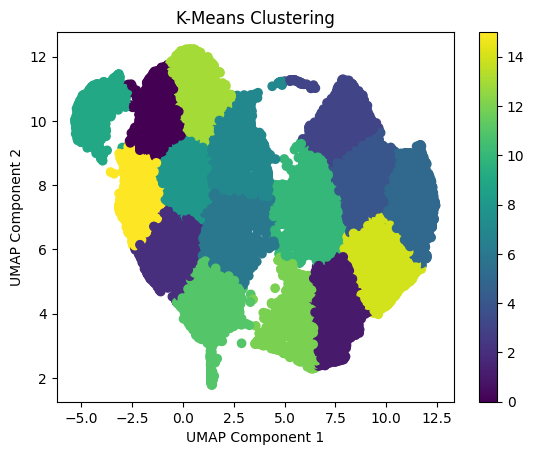

In [15]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Assuming "embedding" is a NumPy array or Pandas DataFrame

# Run k-means clustering
kmeans = KMeans(n_clusters=16)  # Replace K with the desired number of clusters
labels = kmeans.fit_predict(embedding)

# Visualize the clusters
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='viridis')
plt.title('K-Means Clustering')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar()
plt.show()


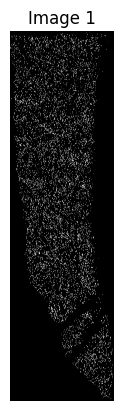

In [11]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the path to the image
image1_path_transformee = "/home/j.maragall/Pipeline_CellMapping/R2_DAPI_cleaned_mask.tif"

# Read and display the image
image1_transformee = mpimg.imread(image1_path_transformee)
plt.imshow(image1_transformee, cmap='gray')
plt.axis('off')
plt.title('Image 1')
plt.show()


/home/j.maragall/.local/lib/python3.11/site-packages/PIL/Image.py:3176: DecompressionBombWarning: Image size (135200340 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


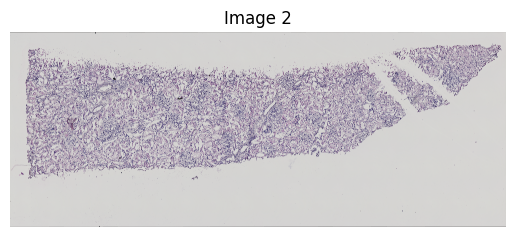

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the path to the image
image2_path_anchor = "/blue/pinaki.sarder/j.maragall/CellMapping/15-1 Stitch.tif"

# Read and display the image
image2_anchor = mpimg.imread(image2_path_anchor)
plt.imshow(image2_anchor, cmap='gray')
plt.axis('off')
plt.title('Image 2')
plt.show()


In [13]:
#"/blue/pinaki.sarder/j.maragall/CellMapping/15-1 Stitch.tif"

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from umap import UMAP

# Specify the path to the CSV file
csv_file_path = "/home/j.maragall/j.maragall/Replication2 _DAPImapping/features.csv"

# Load the data from the CSV file
features_df = pd.read_csv(csv_file_path)

# Specify the percentage threshold for dropping
zero_threshold = 0.97

# Create a mask of boolean values representing whether each value in the DataFrame is zero
is_zero = features_df == 0

# Calculate the percentage of zeros in each column
zero_percentage = is_zero.mean()

# Identify the columns which have more than 97% zeros
columns_to_drop = zero_percentage[zero_percentage > zero_threshold].index

# Drop those columns from the DataFrame
features_df = features_df.drop(columns=columns_to_drop)

# Print the updated DataFrame
features_df.head()


,channel_0_mean,channel_1_mean,channel_2_mean,channel_3_mean,channel_8_mean,channel_9_mean,channel_10_mean,channel_11_mean,channel_12_mean,channel_13_mean,...,channel_37_entropy,channel_38_entropy,channel_39_entropy,channel_40_entropy,channel_41_entropy,channel_42_entropy,channel_43_entropy,area,perimeter,eccentricity
0,48.707546,4.549449,20.697490,2.824315,6.330189,0.809399,0.655126,1.184556,0.462264,0.498574,...,0.803384,0.645425,1.128856,0.849057,0.429841,0.184763,0.593356,106.0,49.177670,0.929295
1,52.120000,5.513523,30.398933,2.987636,5.426667,0.954615,0.911289,1.330439,0.686667,0.684462,...,0.689605,0.475556,1.031131,0.746667,0.602070,0.362489,0.865893,150.0,49.899494,0.882012
2,61.037735,14.205649,201.800460,3.831398,16.580189,6.521965,42.536022,2.963514,2.132076,1.124978,...,1.815541,3.296191,1.460713,0.900943,0.508975,0.259056,0.739893,212.0,58.935028,0.468211
3,55.427418,8.183553,66.970535,3.293343,5.693548,0.742461,0.551249,1.106649,0.830645,0.759050,...,1.885838,3.556386,2.012978,0.750000,0.655313,0.429436,0.967413,124.0,42.485283,0.279038
4,75.893130,18.701248,349.736660,4.118717,5.270992,0.877539,0.770075,1.281670,0.603053,0.581908,...,1.965215,3.862071,1.826194,0.816794,0.639675,0.409184,0.937576,262.0,73.349240,0.921657


UMAP Parameters:
n_neighbors: 7
min_dist: 0.07
n_components: 2
metric: canberra


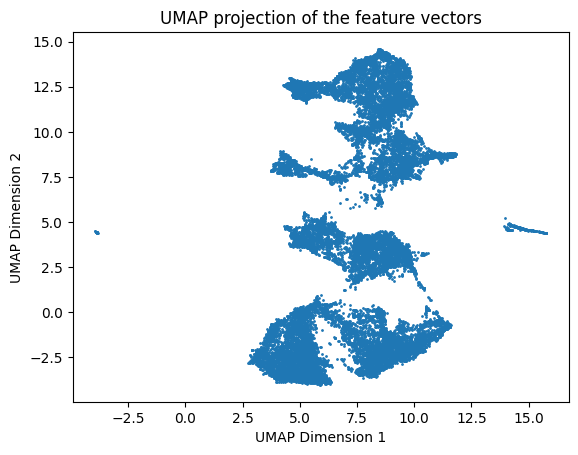

In [11]:
# Perform dimensionality reduction using UMAP
umap_model = UMAP(n_neighbors=7, min_dist=0.07, n_components=2, metric="canberra")
embedding = umap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors')

# Print the parameters
print("UMAP Parameters:")
print(f"n_neighbors: {umap_model.n_neighbors}")
print(f"min_dist: {umap_model.min_dist}")
print(f"n_components: {umap_model.n_components}")
print(f"metric: {umap_model.metric}")

plt.show()


/home/j.maragall/.local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


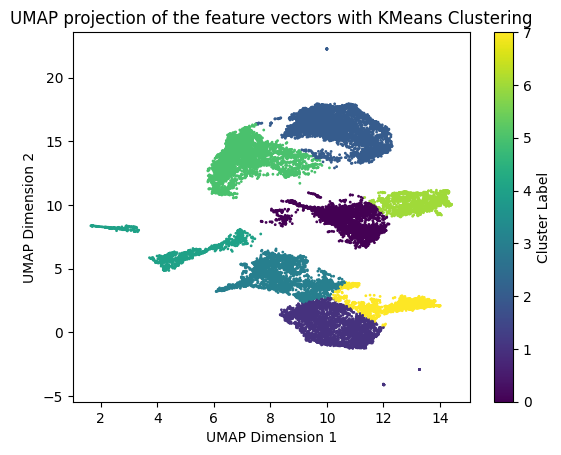

In [49]:
from sklearn.cluster import KMeans

# Apply the KMeans algorithm to the UMAP embeddings
kmeans = KMeans(n_clusters=8)  # change the number of clusters as needed
kmeans.fit(embedding)

# Get the cluster labels
labels = kmeans.labels_

# Plot the results with different colors for each cluster
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='viridis', s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors with KMeans Clustering')
plt.colorbar(label='Cluster Label')
plt.show()


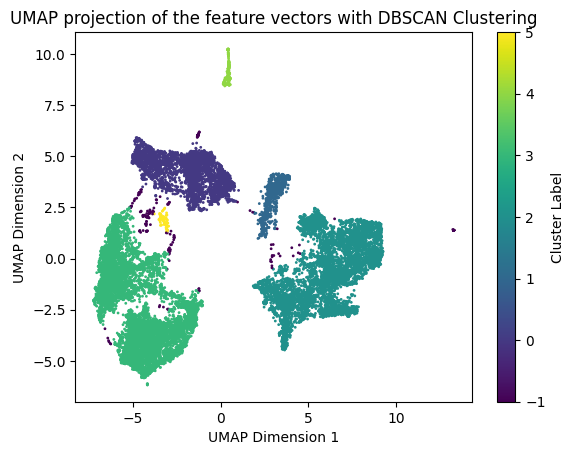

In [100]:
from sklearn.cluster import DBSCAN

# Apply the DBSCAN algorithm to the UMAP embeddings
dbscan = DBSCAN(eps=0.4, min_samples=50)  # adjust these parameters as needed
labels = dbscan.fit_predict(embedding)

# Plot the results with different colors for each cluster
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='viridis', s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors with DBSCAN Clustering')
plt.colorbar(label='Cluster Label')
plt.show()


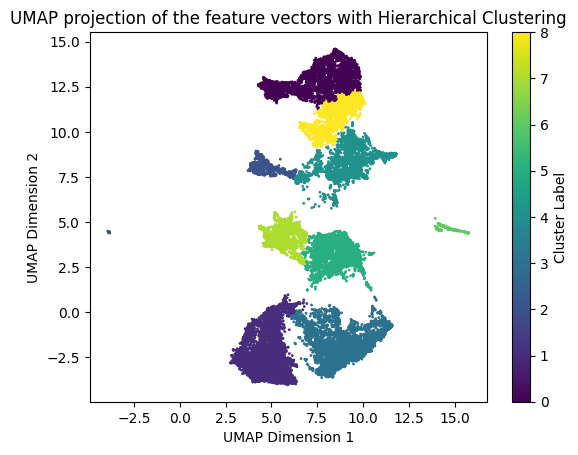

In [12]:
from sklearn.cluster import AgglomerativeClustering

# Apply the AgglomerativeClustering algorithm to the UMAP embeddings
agg_clustering = AgglomerativeClustering(n_clusters=9)  # adjust the number of clusters as needed
labels = agg_clustering.fit_predict(embedding)

# Plot the results with different colors for each cluster
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='viridis', s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors with Hierarchical Clustering')
plt.colorbar(label='Cluster Label')
plt.show()


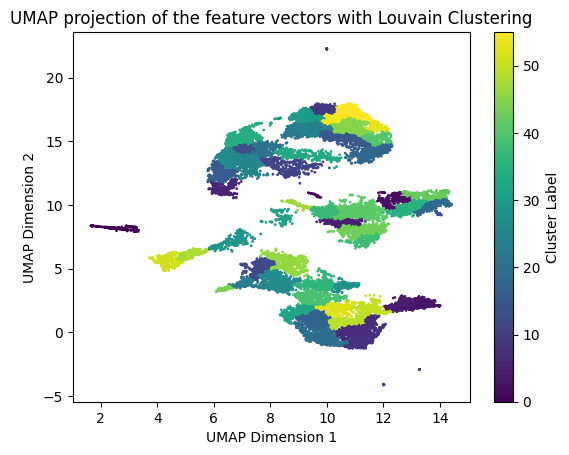

In [74]:
import community as community_louvain
import networkx as nx
from sklearn.neighbors import kneighbors_graph

# Create a nearest neighbors graph from the UMAP embeddings
knn_graph = kneighbors_graph(embedding, n_neighbors=15, mode='connectivity')

# Convert the sparse matrix to a NetworkX graph
network_graph = nx.to_networkx_graph(knn_graph)

# Apply the Louvain method
partition = community_louvain.best_partition(network_graph)

# Convert the partition (a dict) to a list
labels = list(partition.values())

# Plot the results with different colors for each cluster
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='viridis', s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors with Louvain Clustering')
plt.colorbar(label='Cluster Label')
plt.show()


t-SNE Parameters:
n_components: 2
perplexity: 30
learning_rate: 200
metric: canberra


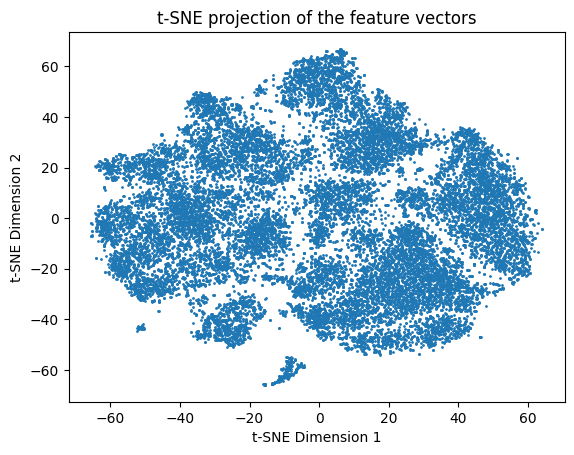

In [93]:
from sklearn.manifold import TSNE

# Perform dimensionality reduction using t-SNE
tsne_model = TSNE(n_components=2, perplexity=30, learning_rate=200, metric="canberra")
embedding_tsne = tsne_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_tsne[:, 0], embedding_tsne[:, 1], s=1)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE projection of the feature vectors')

# Print the parameters
print("t-SNE Parameters:")
print(f"n_components: {tsne_model.n_components}")
print(f"perplexity: {tsne_model.perplexity}")
print(f"learning_rate: {tsne_model.learning_rate}")
print(f"metric: {tsne_model.metric}")

plt.show()


In [ ]:
from sklearn.cluster import KMeans

# Apply the KMeans algorithm to the UMAP embeddings
kmeans = KMeans(n_clusters=8)  # change the number of clusters as needed
kmeans.fit(embedding_tsne)

# Get the cluster labels
labels = kmeans.labels_

# Plot the results with different colors for each cluster
plt.scatter(embedding_tsne[:, 0], embedding_tsne[:, 1], c=labels, cmap='viridis', s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors with KMeans Clustering')
plt.colorbar(label='Cluster Label')
plt.show()


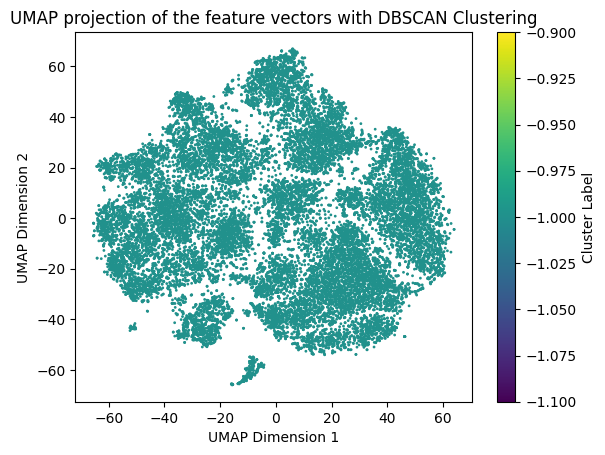

In [95]:
from sklearn.cluster import DBSCAN

# Apply the DBSCAN algorithm to the UMAP embeddings
dbscan = DBSCAN(eps=0.4, min_samples=50)  # adjust these parameters as needed
labels = dbscan.fit_predict(embedding_tsne)

# Plot the results with different colors for each cluster
plt.scatter(embedding_tsne[:, 0], embedding_tsne[:, 1], c=labels, cmap='viridis', s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors with DBSCAN Clustering')
plt.colorbar(label='Cluster Label')
plt.show()


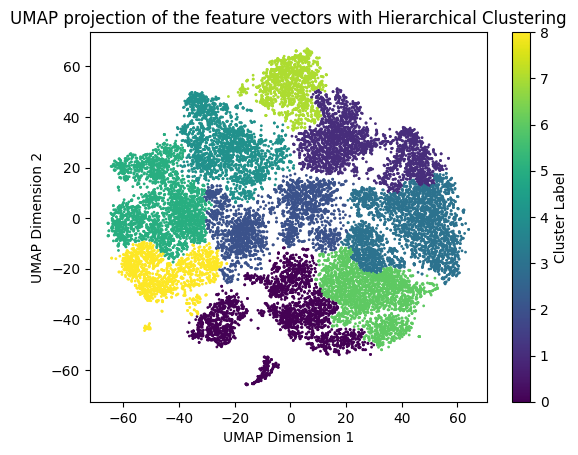

In [96]:
from sklearn.cluster import AgglomerativeClustering

# Apply the AgglomerativeClustering algorithm to the UMAP embeddings
agg_clustering = AgglomerativeClustering(n_clusters=9)  # adjust the number of clusters as needed
labels = agg_clustering.fit_predict(embedding_tsne)

# Plot the results with different colors for each cluster
plt.scatter(embedding_tsne[:, 0], embedding_tsne[:, 1], c=labels, cmap='viridis', s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors with Hierarchical Clustering')
plt.colorbar(label='Cluster Label')
plt.show()


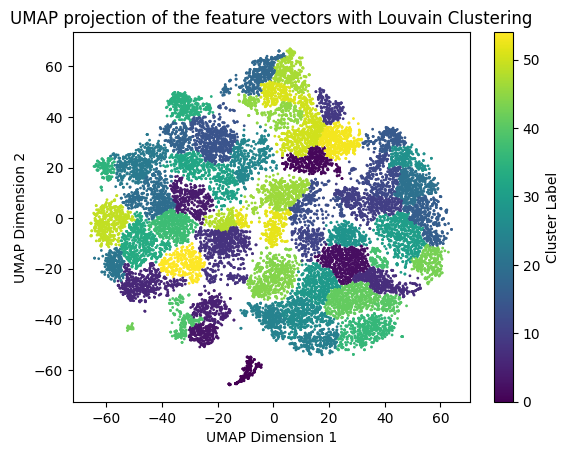

In [97]:
import community as community_louvain
import networkx as nx
from sklearn.neighbors import kneighbors_graph

# Create a nearest neighbors graph from the UMAP embeddings
knn_graph = kneighbors_graph(embedding_tsne, n_neighbors=15, mode='connectivity')

# Convert the sparse matrix to a NetworkX graph
network_graph = nx.to_networkx_graph(knn_graph)

# Apply the Louvain method
partition = community_louvain.best_partition(network_graph)

# Convert the partition (a dict) to a list
labels = list(partition.values())

# Plot the results with different colors for each cluster
plt.scatter(embedding_tsne[:, 0], embedding_tsne[:, 1], c=labels, cmap='viridis', s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP projection of the feature vectors with Louvain Clustering')
plt.colorbar(label='Cluster Label')
plt.show()


In [ ]:
from sklearn.manifold import SpectralEmbedding

# Perform dimensionality reduction using Spectral Embedding
spectral_model = SpectralEmbedding(n_components=2, affinity='nearest_neighbors', n_neighbors=10)
embedding_spectral = spectral_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_spectral[:, 0], embedding_spectral[:, 1], s=1)
plt.xlabel('Spectral Embedding Dimension 1')
plt.ylabel('Spectral Embedding Dimension 2')
plt.title('Spectral Embedding projection of the feature vectors')

# Print the parameters
print("Spectral Embedding Parameters:")
print(f"n_components: {spectral_model.n_components}")
print(f"affinity: {spectral_model.affinity}")
print(f"n_neighbors: {spectral_model.n_neighbors}")

plt.show()


LLE Parameters:
n_components: 2
n_neighbors: 10


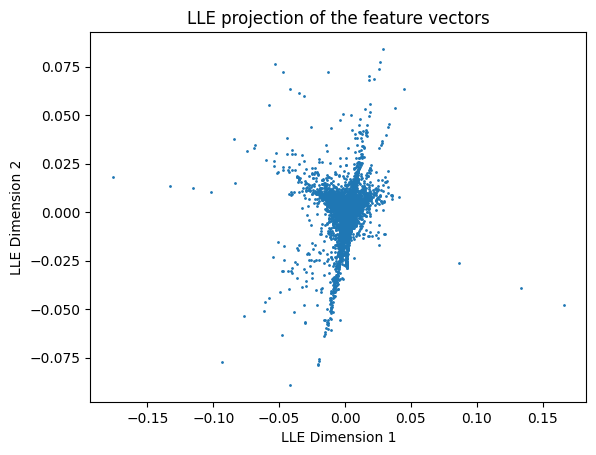

In [2]:
from sklearn.manifold import LocallyLinearEmbedding

# Perform dimensionality reduction using LLE
lle_model = LocallyLinearEmbedding(n_components=2, n_neighbors=10)
embedding_lle = lle_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_lle[:, 0], embedding_lle[:, 1], s=1)
plt.xlabel('LLE Dimension 1')
plt.ylabel('LLE Dimension 2')
plt.title('LLE projection of the feature vectors')

# Print the parameters
print("LLE Parameters:")
print(f"n_components: {lle_model.n_components}")
print(f"n_neighbors: {lle_model.n_neighbors}")

plt.show()


Isomap Parameters:
n_components: 2
n_neighbors: 5


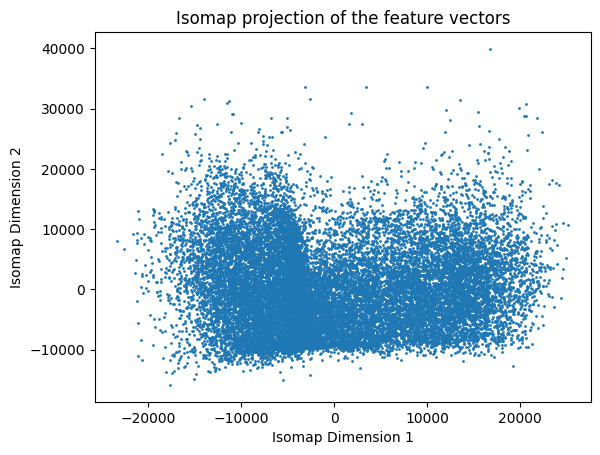

In [3]:
from sklearn.manifold import Isomap

# Perform dimensionality reduction using Isomap
isomap_model = Isomap(n_components=2, n_neighbors=10)
embedding_isomap = isomap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_isomap[:, 0], embedding_isomap[:, 1], s=1)
plt.xlabel('Isomap Dimension 1')
plt.ylabel('Isomap Dimension 2')
plt.title('Isomap projection of the feature vectors')

# Print the parameters
print("Isomap Parameters:")
print(f"n_components: {isomap_model.n_components}")
print(f"n_neighbors: {isomap_model.n_neighbors}")

plt.show()


In [ ]:
from sklearn.manifold import MDS

# Perform dimensionality reduction using MDS
mds_model = MDS(n_components=2, random_state=42)
embedding_mds = mds_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_mds[:, 0], embedding_mds[:, 1], s=1)
plt.xlabel('MDS Dimension 1')
plt.ylabel('MDS Dimension 2')
plt.title('MDS projection of the feature vectors')

# Print the parameters
print("MDS Parameters:")
print(f"n_components: {mds_model.n_components}")

plt.show()


/home/j.maragall/.local/lib/python3.11/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


PCA Parameters:
n_components: 5


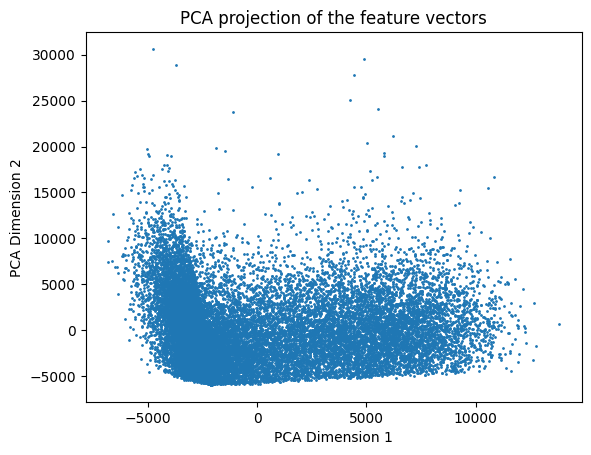

In [7]:
from sklearn.decomposition import PCA

# Perform dimensionality reduction using PCA
pca_model = PCA(n_components=4)
embedding_pca = pca_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_pca[:, 0], embedding_pca[:, 1], s=1)
plt.xlabel('PCA Dimension 1')
plt.ylabel('PCA Dimension 2')
plt.title('PCA projection of the feature vectors')

# Print the parameters
print("PCA Parameters:")
print(f"n_components: {pca_model.n_components}")

plt.show()


Random Projection Parameters:
n_components: 2


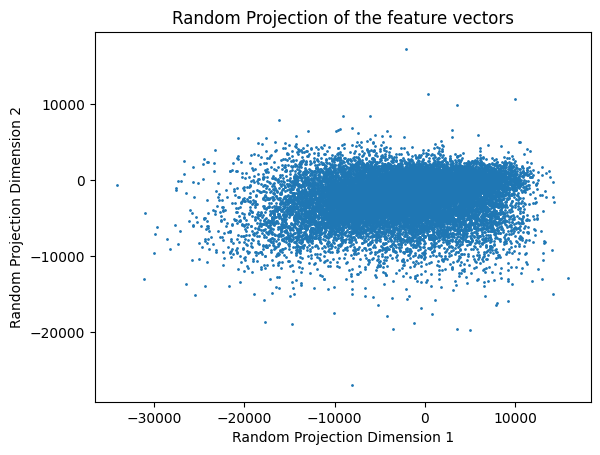

In [2]:
from sklearn.random_projection import GaussianRandomProjection

# Perform dimensionality reduction using Random Projections
rp_model = GaussianRandomProjection(n_components=2, random_state=42)
embedding_rp = rp_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_rp[:, 0], embedding_rp[:, 1], s=1)
plt.xlabel('Random Projection Dimension 1')
plt.ylabel('Random Projection Dimension 2')
plt.title('Random Projection of the feature vectors')

# Print the parameters
print("Random Projection Parameters:")
print(f"n_components: {rp_model.n_components}")

plt.show()


Truncated SVD Parameters:
n_components: 2


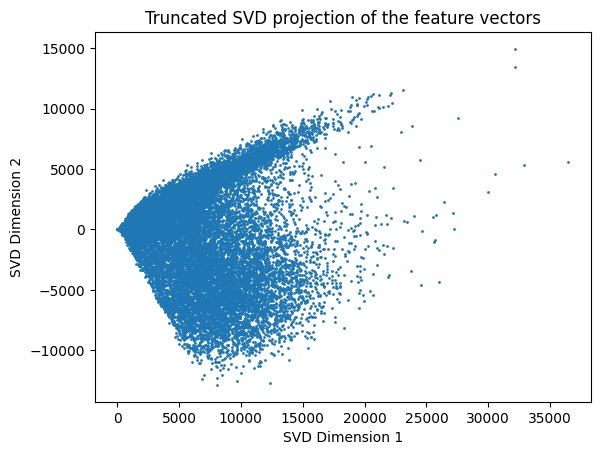

In [3]:
from sklearn.decomposition import TruncatedSVD

# Perform dimensionality reduction using TruncatedSVD
svd_model = TruncatedSVD(n_components=2, random_state=42)
embedding_svd = svd_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_svd[:, 0], embedding_svd[:, 1], s=1)
plt.xlabel('SVD Dimension 1')
plt.ylabel('SVD Dimension 2')
plt.title('Truncated SVD projection of the feature vectors')

# Print the parameters
print("Truncated SVD Parameters:")
print(f"n_components: {svd_model.n_components}")

plt.show()


In [5]:
pip install LargeVis

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement LargeVis (from versions: none)
ERROR: No matching distribution found for LargeVis
Note: you may need to restart the kernel to use updated packages.


Incremental PCA Parameters:
n_components: 2


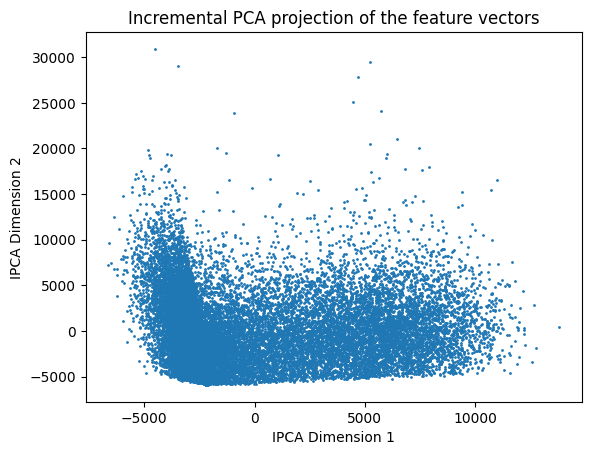

In [6]:
from sklearn.decomposition import IncrementalPCA

# Perform dimensionality reduction using IPCA
ipca_model = IncrementalPCA(n_components=2)
embedding_ipca = ipca_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_ipca[:, 0], embedding_ipca[:, 1], s=1)
plt.xlabel('IPCA Dimension 1')
plt.ylabel('IPCA Dimension 2')
plt.title('Incremental PCA projection of the feature vectors')

# Print the parameters
print("Incremental PCA Parameters:")
print(f"n_components: {ipca_model.n_components}")

plt.show()


/home/j.maragall/.local/lib/python3.11/site-packages/sklearn/decomposition/_dict_learning.py:2290: FutureWarning: The default value of batch_size will change from 3 to 256 in 1.3.
  warnings.warn(


Mini-batch Dictionary Learning Parameters:
n_components: 2


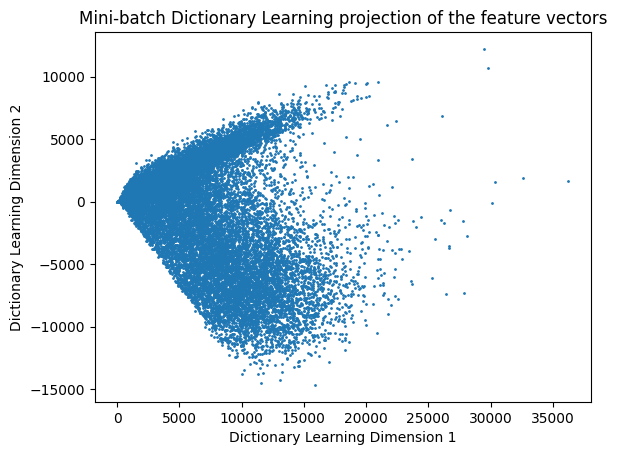

In [7]:
from sklearn.decomposition import MiniBatchDictionaryLearning

# Perform dimensionality reduction using MiniBatchDictionaryLearning
dict_learning_model = MiniBatchDictionaryLearning(n_components=2, random_state=42)
embedding_dict_learning = dict_learning_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding_dict_learning[:, 0], embedding_dict_learning[:, 1], s=1)
plt.xlabel('Dictionary Learning Dimension 1')
plt.ylabel('Dictionary Learning Dimension 2')
plt.title('Mini-batch Dictionary Learning projection of the feature vectors')

# Print the parameters
print("Mini-batch Dictionary Learning Parameters:")
print(f"n_components: {dict_learning_model.n_components}")

plt.show()


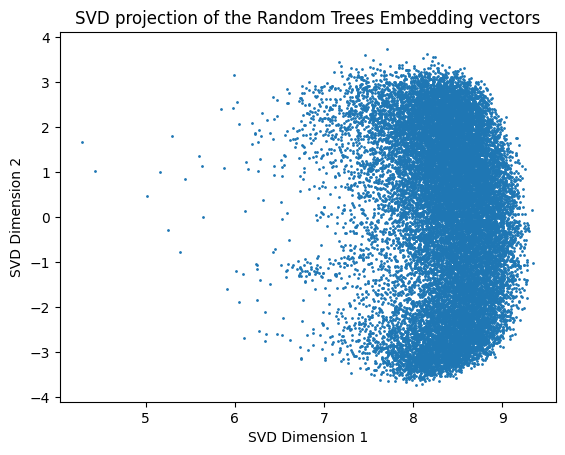

In [8]:
from sklearn.ensemble import RandomTreesEmbedding
from sklearn.decomposition import TruncatedSVD

# Start with a Random Trees Embedding
trees_model = RandomTreesEmbedding(n_estimators=100, max_depth=3, random_state=42)
embedding_trees = trees_model.fit_transform(features_df)

# Use TruncatedSVD for the visualization. The dimensionality could be very high after the Random Trees Embedding.
svd_model = TruncatedSVD(n_components=2, random_state=42)
embedding_svd = svd_model.fit_transform(embedding_trees)

# Plot the results
plt.scatter(embedding_svd[:, 0], embedding_svd[:, 1], s=1)
plt.xlabel('SVD Dimension 1')
plt.ylabel('SVD Dimension 2')
plt.title('SVD projection of the Random Trees Embedding vectors')

plt.show()


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tiffslide as openslide
from tifffile import imread
from skimage.measure import regionprops, label
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from joblib import Parallel, delayed
import pandas as pd
from umap import UMAP

/apps/jupyter/6.5.4/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-04-04 22:58:41.256780: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-04 22:58:45.249137: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Assuming 'DAPI_mask' is your DAPI mask image
# Assuming 'object_cluster_labels' is the dictionary mapping cluster labels to objects

# Create a copy of the DAPI mask to store the colored objects
colored_mask = np.zeros_like(DAPI_mask, dtype=np.uint8)

# Iterate over each object in the DAPI mask
for region_label in range(1, number_of_objects + 1):
    # Get the cluster label for the object
    cluster_label = object_cluster_labels[region_label]

    # Assign a color to the object based on the cluster label
    color = cm.viridis(cluster_label / 10)[:3] * 255  # Adjust the colormap as per your needs

    # Create a binary mask for the current object
    object_mask = DAPI_mask == region_label

    # Reshape the color array to match the shape of the object mask
    color = np.reshape(color, (1, 1, 3))

    # Color the object in the colored mask using the binary mask
    colored_mask = np.where(object_mask[..., None], color, colored_mask)

# Display the colored mask
plt.imshow(colored_mask)
plt.axis('off')
plt.show()


/scratch/local/27697728/ipykernel_2126396/3411546858.py:11: UserWarning: compatibility: aliasing tiffslide.TiffSlide to 'OpenSlide'
  slide1 = openslide.OpenSlide(image1_path_transformee)
/scratch/local/27697728/ipykernel_2126396/3411546858.py:12: UserWarning: compatibility: aliasing tiffslide.TiffSlide to 'OpenSlide'
  slide2 = openslide.OpenSlide(image2_path_anchor)


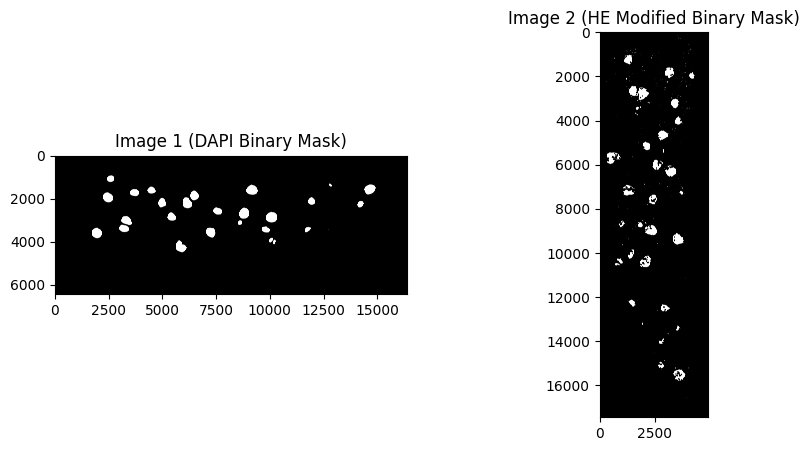

In [16]:
def normalize_image(image, target_dtype=np.uint8):
    normalized_image = cv2.normalize(image, None, 0, np.iinfo(target_dtype).max, cv2.NORM_MINMAX)
    return normalized_image.astype(target_dtype)



# Read the images using OpenSlide
image1_path_transformee = "/home/j.maragall/Pipeline_CellMapping/glom_processed_image.tif" #"/home/j.maragall/Pipeline_CellMapping/R3_HE_modified_binary_mask.tiff" # "/blue/pinaki.sarder/j.maragall/CellMapping/15-1 Stitch.tif"
image2_path_anchor = "aggressively_closed_channel_25_binary_mask.tif"

slide1 = openslide.OpenSlide(image1_path_transformee)
slide2 = openslide.OpenSlide(image2_path_anchor)

# Convert the images to NumPy arrays and normalize them to uint8
img1 = normalize_image(np.array(slide1.get_thumbnail(slide1.dimensions)), np.uint8)
img2 = normalize_image(np.array(slide2.get_thumbnail(slide2.dimensions)), np.uint8)

# Visualize the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray')
plt.title("Image 1 (DAPI Binary Mask)")

plt.subplot(1, 2, 2)
plt.imshow(img2, cmap='gray')
plt.title("Image 2 (HE Modified Binary Mask)")

plt.show()



# Create SIFT detector
sift = cv2.SIFT_create()

# Find keypoints and descriptors using SIFT
kp1, d1 = sift.detectAndCompute(img1, None)
kp2, d2 = sift.detectAndCompute(img2, None)

# Flann-based matcher
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
matcher = cv2.FlannBasedMatcher(index_params, search_params)

# Find matches using KNN
matches = matcher.knnMatch(d1, d2, k=2)

# Filter matches using the ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# ... rest of the code for finding homography, warping and computing IoU


# Define empty matrices
p1 = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
p2 = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

# Find the homography matrix
homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)

# Use this matrix to transform the binary mask wrt the reference binary mask
height, width = img2.shape[:2]
transformed_mask = cv2.warpPerspective(img1, homography, (width, height))

In [21]:
pip install SimpleITK

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


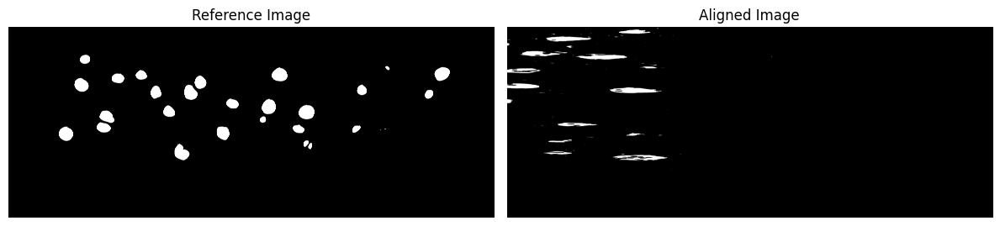

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tiffslide as openslide

def normalize_image(image, target_dtype=np.uint8):
    normalized_image = cv2.normalize(image, None, 0, np.iinfo(target_dtype).max, cv2.NORM_MINMAX)
    return normalized_image.astype(target_dtype)

# Read the images using OpenSlide
image1_path_transformee = "/home/j.maragall/Pipeline_CellMapping/glom_processed_image.tif"
image2_path_anchor = "aggressively_closed_channel_25_binary_mask.tif"

slide1 = openslide.open_slide(image1_path_transformee)
slide2 = openslide.open_slide(image2_path_anchor)

# Convert the images to NumPy arrays and normalize them to uint8
img1 = normalize_image(np.array(slide1.read_region((0, 0), 0, slide1.dimensions)), np.uint8)
img2 = normalize_image(np.array(slide2.read_region((0, 0), 0, slide2.dimensions)), np.uint8)

# Ensure the images have the same size
if img1.shape != img2.shape:
    img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

# Convert images to float32 for phase correlation
img1_float = np.float32(img1)
img2_float = np.float32(img2)

# Perform phase correlation
shift, _ = cv2.phaseCorrelate(img1_float, img2_float)

# Calculate the translation matrix
M = np.float32([[1, 0, shift[0]], [0, 1, shift[1]]])

# Apply the translation to align the images
aligned_img = cv2.warpAffine(img2, M, (img1.shape[1], img1.shape[0]))

# Visualize the original and aligned images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(img1, cmap='gray')
ax1.set_title('Reference Image')
ax1.axis('off')
ax2.imshow(aligned_img, cmap='gray')
ax2.set_title('Aligned Image')
ax2.axis('off')
plt.tight_layout()
plt.show()

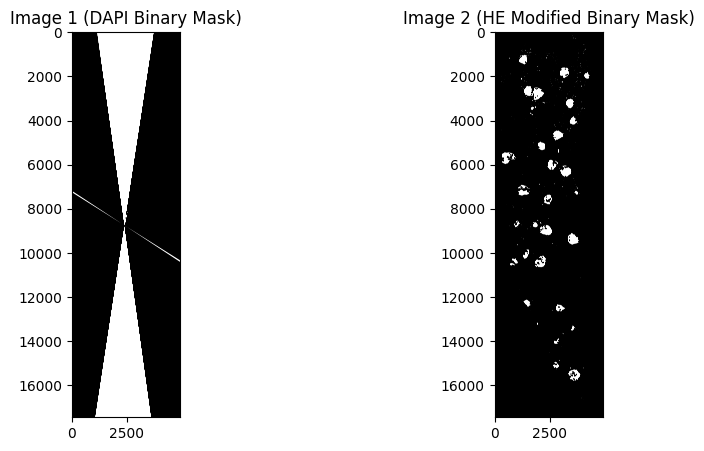

In [17]:
# Visualize the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(transformed_mask, cmap='gray')
plt.title("Image 1 (DAPI Binary Mask)")

plt.subplot(1, 2, 2)
plt.imshow(img2, cmap='gray')
plt.title("Image 2 (HE Modified Binary Mask)")

plt.show()



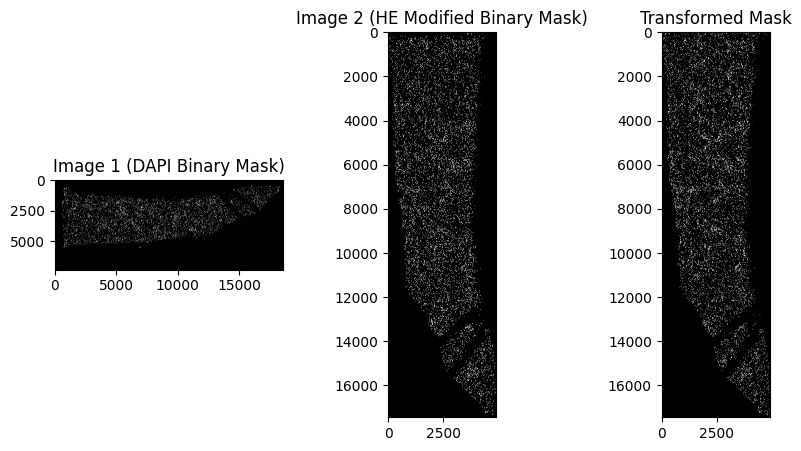

In [5]:
# Visualize the transformed mask
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(img1, cmap='gray')
plt.title("Image 1 (DAPI Binary Mask)")

plt.subplot(1, 3, 2)
plt.imshow(img2, cmap='gray')
plt.title("Image 2 (HE Modified Binary Mask)")

plt.subplot(1, 3, 3)
plt.imshow(transformed_mask, cmap='gray')
plt.title("Transformed Mask")

plt.show()


In [6]:
image3_path = "/blue/pinaki.sarder/j.maragall/Pipeline_CellMapping/processed_image.tif"
slide3 = openslide.OpenSlide(image3_path)

img3 = normalize_image(np.array(slide3.get_thumbnail(slide3.dimensions)), np.uint8)

transformed_img3 = cv2.warpPerspective(img3, homography, (width, height))

plt.imshow(transformed_img3, cmap='gray')
plt.title("Transformed Image 3")
plt.show()

/scratch/local/27231949/ipykernel_776135/1938436899.py:2: UserWarning: compatibility: aliasing tiffslide.TiffSlide to 'OpenSlide'
  slide3 = openslide.OpenSlide(image3_path)


FileNotFoundError: [Errno 2] No such file or directory: '/blue/pinaki.sarder/j.maragall/Pipeline_CellMapping/processed_image.tif'

In [17]:

# Specify the path and filename for saving the transformed image
output_path = "./transformed_image.tif"

# Save the transformed image as a .tif file
cv2.imwrite(output_path, transformed_img3)


NameError: name 'transformed_img3' is not defined

In [13]:
from skimage import io

# Loading the image
transformed_img3 = io.imread("/home/j.maragall/j.maragall/Replication2 _DAPImapping/transformed_image.tif")


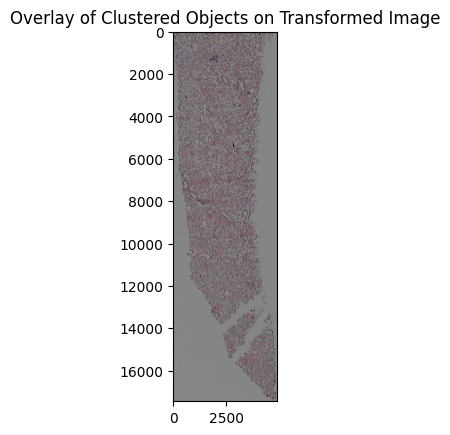

In [14]:
from matplotlib import cm
from skimage import img_as_ubyte
import matplotlib

# Create a color map
cmap = matplotlib.colormaps.get_cmap('tab10')  # 'tab10' colormap has exactly 10 distinct colors

# Convert the labels to colors using the colormap and convert it to the desired type
colored_labels = cmap(labels / 10)[:, :3]  # Normalize the labels to [0, 1] for the colormap
colored_labels = img_as_ubyte(colored_labels)  # Convert to 8-bit unsigned byte format

# Create a new image where each pixel of an object is the color of the cluster it belongs to
colored_image = np.zeros((*DAPI_mask.shape, 3), dtype=np.uint8)  # Pre-allocate memory

# Iterate over all objects (assume that 'labels' is an array that contains the cluster id of each object)
for region_label in range(1, number_of_objects + 1):
    # Create a mask for the current object
    object_mask = (labeled_image == region_label)

    # Set the color of the object in the new image
    colored_image[object_mask] = colored_labels[labels[region_label - 1]]

# Now 'colored_image' is a color image where each object is colored according to its cluster

# Combine the images (you may want to adjust the alpha values to get the desired look)
combined_img = cv2.addWeighted(transformed_img3, 0.6, colored_image, 0.4, 0)

# Plotting the combined image
plt.imshow(combined_img)
plt.title("Overlay of Clustered Objects on Transformed Image")
plt.show()


In [17]:
# Save the combined image
cv2.imwrite('good_combined_image.png', cv2.cvtColor(combined_img, cv2.COLOR_RGB2BGR))


True

(17448, 4908)

In [14]:
transformed_img3.shape

(17448, 4908, 3)

In [15]:
DAPI_mask.shape

(17448, 4908)

In [16]:
def create_cluster_overlay(channel_image, cluster_image):
    """
    Create an overlay of the clusters onto a channel image.

    Args:
        channel_image: A 2D image representing a single channel.
        cluster_image: A 2D image with the cluster labels.

    Returns:
        An RGB image with the clusters overlaid onto the channel image.
    """

    # Convert the channel image to RGB
    channel_image_color = cv2.cvtColor(channel_image, cv2.COLOR_GRAY2RGB)

    # Overlay the clusters onto the channel image
    combined_img = cv2.addWeighted(channel_image_color, 0.6, cluster_image, 0.4, 0)

    return combined_img




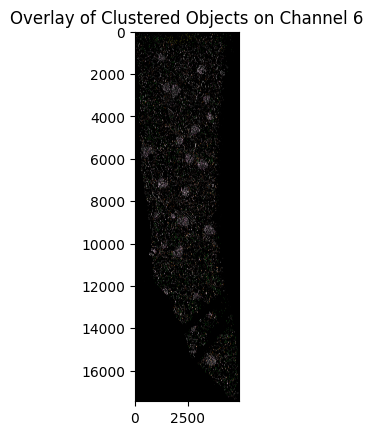

In [18]:
def visualize_channels_with_overlay(image, cluster_image, channel):
    """
    Get the channel index based on the lowest value in the tuple and visualize the image based on where the channels actually are.
    Adds an overlay of the identified clusters to the visualized channel.

    Args:
        image: The image to visualize.
        cluster_image: The image showing identified clusters.
        channel: The channel to visualize.
    """

    min_value = min(image.shape)

    if min_value == image.shape[0]:
        # The channels are in the first dimension
        slide = image[channel]
        slide = cv2.cvtColor(slide, cv2.COLOR_GRAY2RGB)
        combined_img = cv2.addWeighted(slide, 0.6, cluster_image, 0.4, 0)
        plt.imshow(combined_img)
        plt.title(f"Overlay of Clustered Objects on Channel {channel}")
        plt.show()
    elif min_value == image.shape[1]:
        # The channels are in the second dimension
        slide = image[:, channel]
        slide = cv2.cvtColor(slide, cv2.COLOR_GRAY2RGB)
        combined_img = cv2.addWeighted(slide, 0.6, cluster_image, 0.4, 0)
        plt.imshow(combined_img)
        plt.title(f"Overlay of Clustered Objects on Channel {channel}")
        plt.show()
    else:
        # The channels are in the third dimension
        slide = image[:, :, channel]
        slide = cv2.cvtColor(slide, cv2.COLOR_GRAY2RGB)
        combined_img = cv2.addWeighted(slide, 0.6, cluster_image, 0.4, 0)
        plt.imshow(combined_img)
        plt.title(f"Overlay of Clustered Objects on Channel {channel}")
        plt.show()

#visualize
visualize_channels_with_overlay(CODEX, colored_image, 6)


In [19]:
import os
import cv2
import numpy as np

def visualize_channels_with_overlay(image, cluster_image, channel, save_dir):
    """
    Get the channel index based on the lowest value in the tuple and visualize the image based on where the channels actually are.
    Adds an overlay of the identified clusters to the visualized channel.

    Args:
        image: The image to visualize.
        cluster_image: The image showing identified clusters.
        channel: The channel to visualize.
        save_dir: The directory to save the images.
    """

    min_value = min(image.shape)

    if min_value == image.shape[0]:
        # The channels are in the first dimension
        slide = image[channel]
    elif min_value == image.shape[1]:
        # The channels are in the second dimension
        slide = image[:, channel]
    else:
        # The channels are in the third dimension
        slide = image[:, :, channel]

    # Convert grayscale image to BGR color
    slide = cv2.cvtColor(slide, cv2.COLOR_GRAY2BGR)

    # Compute weighted sum of the slide and cluster image
    combined_img = cv2.addWeighted(slide.astype(np.float32), 0.6, cluster_image.astype(np.float32), 0.4, 0)

    # Convert the combined image back to 8-bit unsigned integer
    combined_img = combined_img.clip(0, 255).astype(np.uint8)

    # Save the image
    filename = os.path.join(save_dir, f"overlay_channel_{channel}.png")
    cv2.imwrite(filename, combined_img)

# Loop through all channels and save visualized images
num_channels = CODEX.shape[position_channels(CODEX)]
save_dir = "/blue/pinaki.sarder/j.maragall/CellMapping/color_coded" # Define your directory path here

for channel in range(num_channels):
    visualize_channels_with_overlay(CODEX, colored_image, channel, save_dir)


In [39]:
def calculate_mean_intensities(CODEX, labeled_image, labels):
    """
    Calculate the mean intensity of each channel within each cluster.

    Args:
        CODEX: The CODEX image with multiple channels.
        labeled_image: The image with labeled clusters.
        labels: The unique labels for each cluster.

    Returns:
        A 2D numpy array with the mean intensities. The shape of the array is
        (number_of_clusters, number_of_channels). Each row corresponds to a
        cluster, and each column corresponds to a channel.
    """

    number_of_clusters = len(labels)
    number_of_channels = CODEX.shape[0]

    # Preallocate a 2D array for the mean intensities
    mean_intensities = np.zeros((number_of_clusters, number_of_channels))

    # Iterate over all clusters
    for i, label in enumerate(labels):
        # Create a mask for the current cluster
        cluster_mask = (labeled_image == label)

        # Iterate over all channels
        for j in range(number_of_channels):
            # Extract the current channel
            channel = CODEX[j, :, :]

            # Calculate the mean intensity of the current channel within the current cluster
            mean_intensities[i, j] = channel[cluster_mask].mean()

    return mean_intensities


In [ ]:
# Use the function
mean_intensities = calculate_mean_intensities(CODEX, labeled_image, labels)

In [ ]:
import seaborn as sns

sns.heatmap(mean_intensities, cmap="viridis")
plt.xlabel("Channel")
plt.ylabel("Cluster")
plt.title("Mean Intensity of Each Channel Within Each Cluster")
plt.show()
